In [1]:
import xarray as xr
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import xesmf as xe
import pandas as pd
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import AxesGrid
import warnings
import cmocean
from scipy.stats import pearsonr, linregress
from matplotlib.colors import TwoSlopeNorm
from matplotlib import patheffects
import cartopy
import matplotlib.pyplot as plt
import cartopy.feature as cfeat
from cartopy.mpl.geoaxes import GeoAxes
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import xesmf as xe
import matplotlib.patches as mpatches
import matplotlib.dates as mdates
import warnings
import matplotlib.projections
import scipy.stats as stats
#from geopy import distance
#import gsw_xarray as gsw
#import time
import matplotlib.path as mpath
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator

#ignore by message
warnings.filterwarnings("ignore")
matplotlib.rcParams['font.family'] = 'Arial'

In [2]:
# FUNCTIONS
# To create gridlines on maps

font='Arial'
def gline(ax,t=False,b=False,l=False,r=False, xl=True, yl=True, tick_size=14, gl_color='black',lw=1):   
    gl = ax.gridlines(crs=ccrs.PlateCarree(), linewidth=lw, color=gl_color, alpha=0.5, linestyle=':', draw_labels=False)
    gl.xlabels_top = t
    gl.ylabels_left = l
    gl.ylabels_right=r
    gl.xlabels_bottom = b
    gl.xlines = xl
    gl.ylines = yl
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'weight': 'light','family':font, 'size': tick_size}
    gl.ylabel_style = {'weight': 'light','family':font, 'size': tick_size}

#To create cmap diverging at 0

def truncate_colormap(cmap, minval, maxval, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

# create shifted cmap for MOC plots since positive and negative stream functions are not balanced
def shiftedColorMap1(cmap, min_val, max_val,a,b, name):
    '''Function to offset the "center" of a colormap. Useful for data with a negative min and positive max and you want the middle of the colormap's dynamic range to be at zero. Adapted from https://stackoverflow.com/questions/7404116/defining-the-midpoint-of-a-colormap-in-matplotlib

    Input
    -----
      cmap : The matplotlib colormap to be altered.
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower ofset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax/(vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highets point in the colormap's range.
          Defaults to 1.0 (no upper ofset). Should be between
          `midpoint` and 1.0.'''
    epsilon = 0.001
    start, stop = a, b
    min_val, max_val = min(0.0, min_val), max(0.0, max_val) # Edit #2
    midpoint = 1.0 - max_val/(max_val + abs(min_val))
    cdict = {'red': [], 'green': [], 'blue': [], 'alpha': []}
    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)
    # shifted index to match the data
    shift_index = np.hstack([np.linspace(0.0, midpoint, 128, endpoint=False), np.linspace(midpoint, 1.0, 129, endpoint=True)])
    for ri, si in zip(reg_index, shift_index):
        if abs(si - midpoint) < epsilon:
            r, g, b, a = cmap(0.5) # 0.5 = original midpoint.
        else:
            r, g, b, a = cmap(ri)
        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))
    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)
    return newcmap

def calculate_wsc(tau_x, dy):
    """
    Calculate the wind stress curl from zonal wind stress on a rectilinear grid.
    
    Parameters:
    tau_x (1D array): Zonal wind stress component
    dy (1D array): Grid spacing in the y direction
    
    Returns:
    d_tau_x_dy (1D array): Meridional curl of zonal wind stress
    """
    # Initialize arrays for partial derivatives
    d_tau_x_dy = np.zeros_like(tau_x)
    
    # Compute the derivative d_tau_x/dy
    for i in range(1, len(tau_x) - 2):
        #print(i)
        d_tau_x_dy[i] = (tau_x[i + 1] - tau_x[i - 1]) / (dy[i + 1] + dy[i - 1])
    d_tau_x_dy[0] = (tau_x[1] - tau_x[0]) / dy[0]  # Forward difference for the first row
    d_tau_x_dy[-1] = (tau_x[-1] - tau_x[-2]) / dy[-1]  # Backward difference for the last row



In [3]:
path = ""   # Change according to wherever the data is stored 
pathf = "Figures/"

bsf_mio=xr.open_dataset(f'{path}Miocene_BSF_and_diagnostics.nc')  # Miocene global barotropic streamfunction
bsf_pi=xr.open_dataset(f'{path}PI_BSF_and_diagnostics.nc')  # PI global barotropic streamfunction

taux_dTxdy_mio=xr.open_dataset(f'{path}Miocene_BSF_and_diagnostics.nc')  # Miocene gyre strength, windstress and wind stress curl
taux_dTxdy_pi=xr.open_dataset(f'{path}PI_BSF_and_diagnostics.nc')  # PI gyre strength, windstress and wind stress curl

atl_pac_width=xr.open_dataset(f'{path}Atl_Pac_width.nc') # Miocene and PI width of Pacific and Atlantic Oceans

slp_mio=xr.open_dataset(f'{path}Miocene_SLP.nc') # Miocene sea level presssure
slp_pi=xr.open_dataset(f'{path}PI_SLP.nc') # Miocene sea level presssure

zonal_vt=pd.read_csv(f'{path}Zonal_volume_transport.csv') #zonal volume transport across various gateways in the Miocene simulations
gateway_area=pd.read_csv(f'{path}Gateway_depth_area.csv') #gateway depth/areas for various gateways in the Miocene simulations
meridional_gradients=pd.read_csv(f'{path}Meridional_gradients.csv') #ACC transport, Southern Hemisphere westerly wind stress and meridional gradients of density, temperature, and salinity for Miocene and PI simulations
island_rule=pd.read_csv(f'{path}island_rule_theta_tau.csv') # island rule theta_D, theta_S, theta_SA and integral of Tau over the closed contour


panama_cross_section=np.load(f'{path}panama_seaway_cross_section.npz') #cross section depth and latitude of Panama Seaway for the Miocene simulations
panama_cs = [panama_cross_section[key] for key in panama_cross_section]

tethys_cross_section=np.load(f'{path}tethys_seaway_cross_section.npz') #cross section depth and latitude of Tethys Seaway for the Miocene simulations
tet_cs = [tethys_cross_section[key] for key in tethys_cross_section]

drake_cross_section=np.load(f'{path}drake_passage_cross_section.npz') #cross section depth and latitude of Drake Passage for the Miocene simulations
drake_cs = [drake_cross_section[key] for key in drake_cross_section]

panama_cross_section_U=np.load(f'{path}panama_seaway_cross_section_zonal_velocities.npz') #cross section depth and latitude of Panama Seaway for the Miocene simulations with zonal velocities
panama_csU = [panama_cross_section_U[key] for key in panama_cross_section_U]

itf_cross_section_U=np.load(f'{path}indonesian_gateway_cross_section_zonal_velocities.npz') #cross section depth and latitude of Indonesian Gateway for the Miocene simulations with zonal velocities
itf_csU = [itf_cross_section_U[key] for key in itf_cross_section_U]

itf_cross_section_lat=np.load(f'{path}indonesian_gateway_cross_section_latitudes.npz') #cross section depth and latitude of Indonesian Gateway for the Miocene simulations with zonal velocities
itf_cs_lat = [itf_cross_section_lat[key] for key in itf_cross_section_lat]




## Barotropic Streamfunction - Miocene

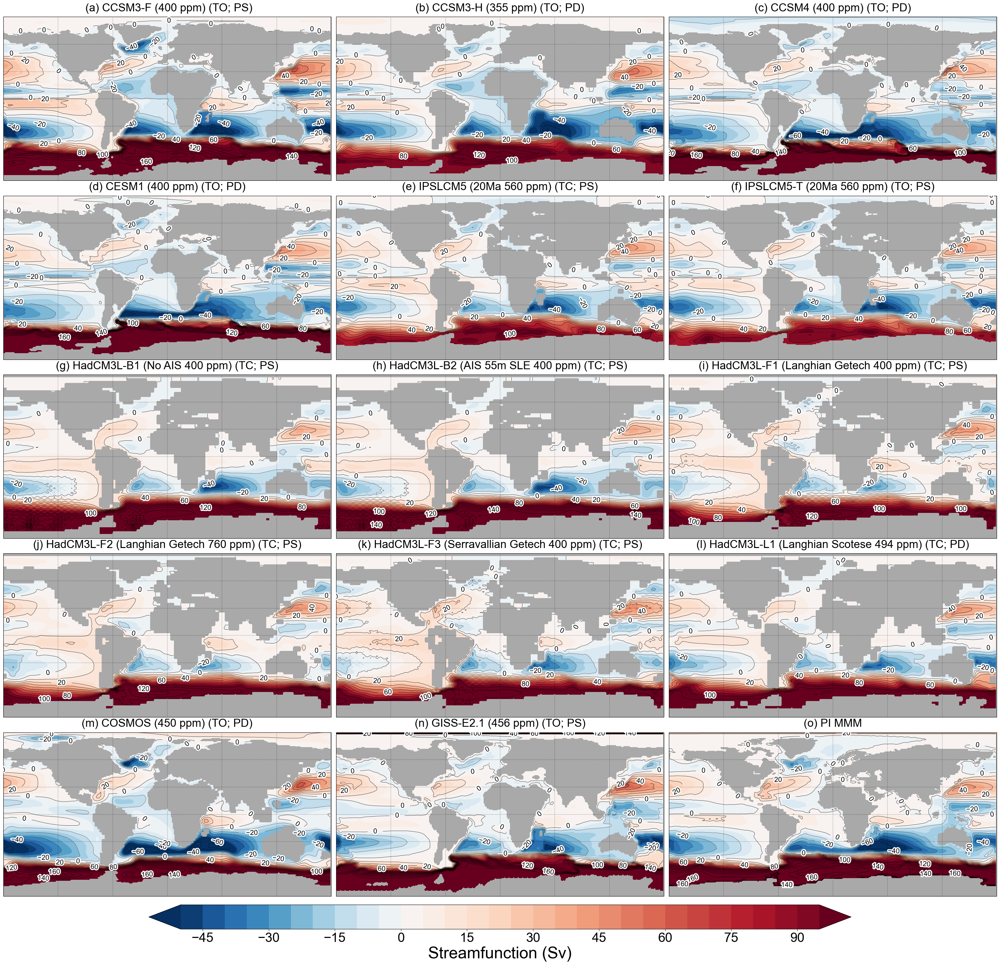

In [4]:
fig = plt.figure(figsize=[30, 27])

# Define the data (only the arrays)
bsf_data = bsf_mio.BSF

# Titles and tick configurations
titles = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

left_ticks = [True, False, False, True, False, False, True, False, False, True, False, False, True, False, False]

norm = colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100)
levels = np.arange(-50, 100, 5)
con_levels = np.arange(-100, 180, 10)
label_levels = con_levels[::2]
cmap = 'RdBu_r'
facecolour = "darkgray"
f1, f, f2, pad = 24, 19, 15, 12
lats, lons = (-90, 90), (-180, 180)
con_color = 'k'
lw, conlw, insp = 5, 0.5, 10
projection = ccrs.PlateCarree()

# Loop through the data and create subplots
for idx, data in enumerate(bsf_data):
    data = data.assign_coords(lon=((data.lon + 180) % 360 - 180))
    data = data.sortby('lon')

    ax = plt.subplot(5, 3, idx + 1, projection=projection)
    bsf = ax.contourf(data.lon, data.lat, data, cmap=cmap, levels=levels, norm=norm, extend='both')
    bsf_con = ax.contour(data.lon, data.lat, data, levels=con_levels, linewidths=conlw, colors='k')
    clbls = ax.clabel(bsf_con, levels=label_levels, inline=1, fontsize=f2, colors=con_color, rightside_up=True, inline_spacing=insp)
    plt.setp(clbls, path_effects=[patheffects.withStroke(linewidth=lw, foreground="w")])
    plt.gca().set_facecolor(facecolour)
    plt.title(titles[idx], fontsize=f1, pad=pad)
    gline(ax, b=(idx >= 11), l=left_ticks[idx], tick_size=f)
    ax.set_xlim([-180, 180])
    ax.set_ylim(lats)

idx=14
data = bsf_pi.BSF.mean(dim='sim')
data = data.assign_coords(lon=((data.lon + 180) % 360 - 180))
data = data.sortby('lon')

ax = plt.subplot(5, 3, 15, projection=projection)
bsf = ax.contourf(data.lon, data.lat, data, cmap=cmap, levels=levels, norm=norm, extend='both')
bsf_con = ax.contour(data.lon, data.lat, data, levels=con_levels, linewidths=conlw, colors='k')
clbls = ax.clabel(bsf_con, levels=label_levels, inline=1, fontsize=f2, colors=con_color, rightside_up=True, inline_spacing=insp)
plt.setp(clbls, path_effects=[patheffects.withStroke(linewidth=lw, foreground="w")])
plt.gca().set_facecolor(facecolour)
plt.title('(o) PI MMM', fontsize=f1, pad=pad)
gline(ax, b=(idx >= 11), l=left_ticks[idx], tick_size=f)
ax.set_xlim([-180, 180])
ax.set_ylim(lats)

# Add colorbar
cbar2_ax = fig.add_axes([0.15, -0.03, 0.7, 0.027])
cbar1 = fig.colorbar(bsf, cax=cbar2_ax, extend='both', orientation='horizontal')
cbar1.ax.tick_params(labelsize=28)
cbar1.set_label('Streamfunction (Sv)', fontsize=35)

# Add overall title
#fig.suptitle('Horizontal Barotropic Streamfunction - Miocene', x=0.515, y=1, fontsize=38)

plt.tight_layout()
plt.savefig(f'{pathf}BSF_Miocene.pdf', dpi=300, bbox_inches='tight')


### BSF - Miocene-PI

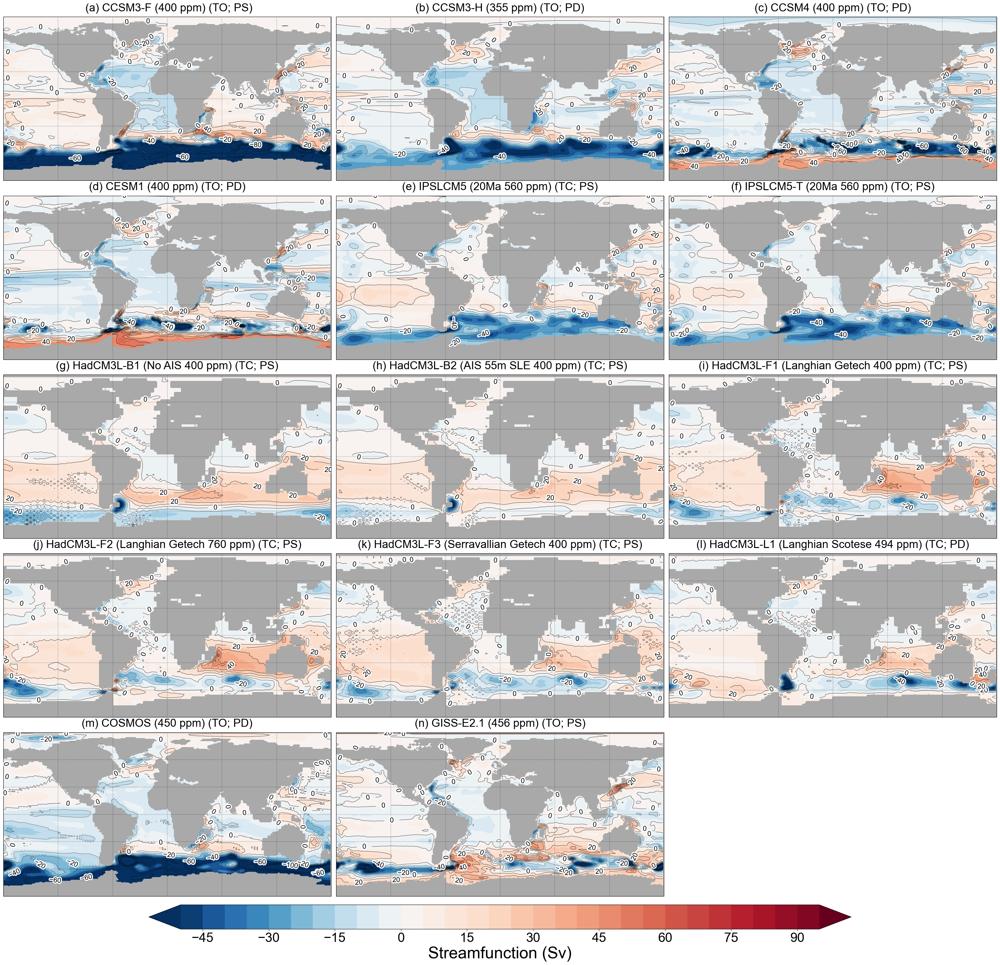

In [5]:
bsf_mio_minus_pi=[bsf_mio.BSF[0]-bsf_pi.BSF[0], 
                  bsf_mio.BSF[1]-bsf_pi.BSF[1],
                  bsf_mio.BSF[2]-bsf_pi.BSF[2],
                  bsf_mio.BSF[3]-bsf_pi.BSF[3],
                  bsf_mio.BSF[4]-bsf_pi.BSF[4],
                  bsf_mio.BSF[5]-bsf_pi.BSF[4],
                  bsf_mio.BSF[6]-bsf_pi.BSF[5],
                  bsf_mio.BSF[7]-bsf_pi.BSF[5],
                  bsf_mio.BSF[8]-bsf_pi.BSF[6],
                  bsf_mio.BSF[9]-bsf_pi.BSF[6],
                  bsf_mio.BSF[10]-bsf_pi.BSF[6],
                  bsf_mio.BSF[11]-bsf_pi.BSF[6],
                  bsf_mio.BSF[12]-bsf_pi.BSF[7],
                  bsf_mio.BSF[13]-bsf_pi.BSF[8]
                  ]
fig = plt.figure(figsize=[30, 27])

# Define the data (only the arrays)
bsf_data = bsf_mio_minus_pi

# Titles and tick configurations
# titles = [' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

titles = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

left_ticks = [True, False, False, True, False, False, True, False, False, True, False, False, True, False]

norm = colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100)
levels = np.arange(-50, 100, 5)
con_levels = np.arange(-100, 180, 10)
label_levels = con_levels[::2]
cmap = 'RdBu_r'
facecolour = "darkgray"
f1, f, f2, pad = 24, 19, 15, 12
lats, lons = (-90, 90), (-180, 180)
con_color = 'k'
lw, conlw, insp = 5, 0.5, 10
projection = ccrs.PlateCarree()

# Loop through the data and create subplots
for idx, data in enumerate(bsf_data):
    data = data.assign_coords(lon=((data.lon + 180) % 360 - 180))
    data = data.sortby('lon')

    ax = plt.subplot(5, 3, idx + 1, projection=projection)
    bsf = ax.contourf(data.lon, data.lat, data, cmap=cmap, levels=levels, norm=norm, extend='both')
    bsf_con = ax.contour(data.lon, data.lat, data, levels=con_levels, linewidths=conlw, colors='k')
    clbls = ax.clabel(bsf_con, levels=label_levels, inline=1, fontsize=f2, colors=con_color, rightside_up=True, inline_spacing=insp)
    plt.setp(clbls, path_effects=[patheffects.withStroke(linewidth=lw, foreground="w")])
    plt.gca().set_facecolor(facecolour)
    plt.title(titles[idx], fontsize=f1, pad=pad)
    gline(ax, b=(idx >= 11), l=left_ticks[idx], tick_size=f)
    ax.set_xlim([-180, 180])
    ax.set_ylim(lats)

# Add colorbar
cbar2_ax = fig.add_axes([0.15, -0.03, 0.7, 0.027])
cbar1 = fig.colorbar(bsf, cax=cbar2_ax, extend='both', orientation='horizontal')
cbar1.ax.tick_params(labelsize=28)
cbar1.set_label('Streamfunction (Sv)', fontsize=35)

# Add overall title
#fig.suptitle('Horizontal Barotropic Streamfunction - Miocene', x=0.515, y=1, fontsize=38)

plt.tight_layout()
plt.savefig(f'{pathf}BSF_Miocene_minus_PI.pdf', dpi=300, bbox_inches='tight')


## Gyre strength, wind stress and wind stress curl

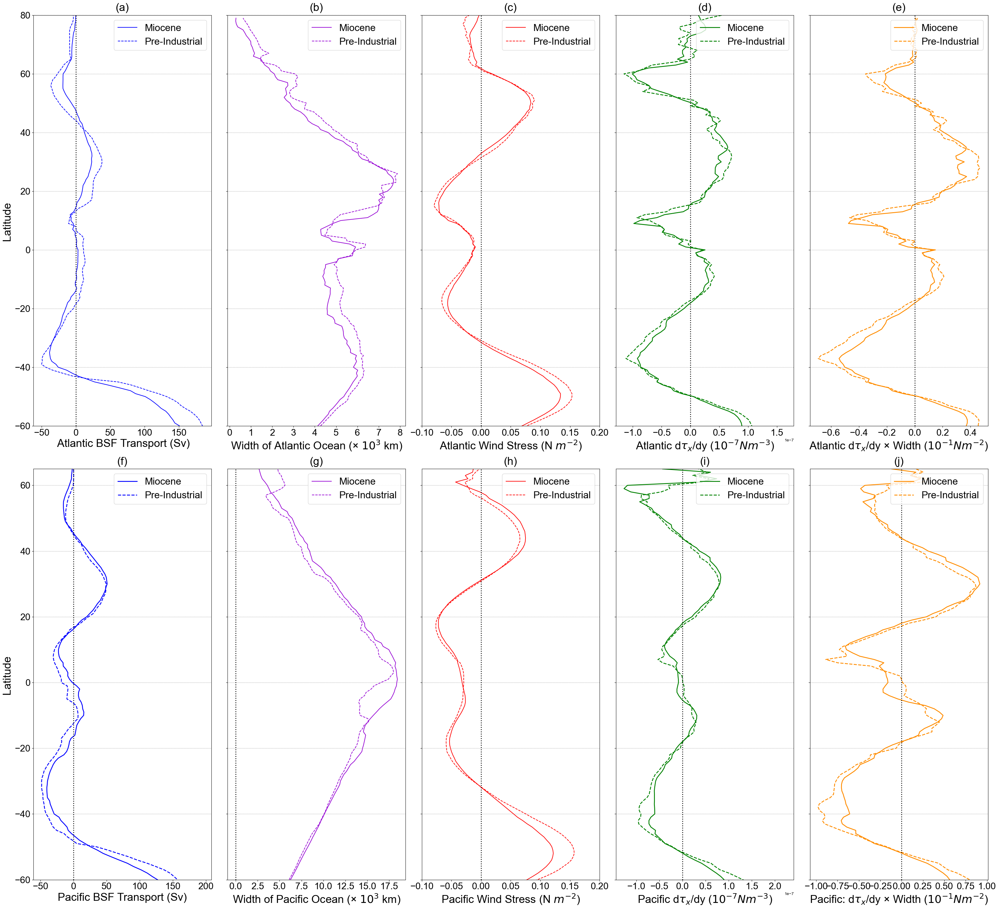

In [6]:
plt.figure(figsize=[33,30])
f2=26;f1=26;ticksz=22;legendfs=23
lw=2
glw=0.9 # grid line width
pad=10
nlim=80 # northern limit
slim=-60 # southern limit
lim_step=10

bsf_atl_max_mio=bsf_mio.BSF_Mio_max_atl
bsf_atl_max_pi=bsf_pi.BSF_PI_max_atl

dTxdy_mean_mio_atl=bsf_mio.dTxdy_Mio_atl
dTxdy_mean_pi_atl=bsf_pi.dTxdy_PI_atl

mio_atl_Tx=bsf_mio.Taux_Mio_atl
pi_atl_Tx=bsf_pi.Taux_PI_atl

mio_atl_width=atl_pac_width.Atlantic_width_miocene
pi_atl_width=atl_pac_width.Atlantic_width_PI


bsf_pac_max_mio=bsf_mio.BSF_Mio_max_pac
bsf_pac_max_pi=bsf_pi.BSF_PI_max_pac

dTxdy_mean_mio_pac=bsf_mio.dTxdy_Mio_pac
dTxdy_mean_pi_pac=bsf_pi.dTxdy_PI_pac

mio_pac_Tx=bsf_mio.Taux_Mio_pac
pi_pac_Tx=bsf_pi.Taux_PI_pac

mio_pac_width=atl_pac_width.Pacific_width_miocene
pi_pac_width=atl_pac_width.Pacific_width_PI


lat_bins = np.arange(-90, 91, 3)

# Use groupby_bins to average
smoothed_dTxdy_mio_atl = dTxdy_mean_mio_atl.groupby_bins("lat", lat_bins).mean()
smoothed_dTxdy_mio_pac = dTxdy_mean_mio_pac.groupby_bins("lat", lat_bins).mean()
smoothed_dTxdy_pi_atl = dTxdy_mean_pi_atl.groupby_bins("lat", lat_bins).mean()
smoothed_dTxdy_pi_pac = dTxdy_mean_pi_pac.groupby_bins("lat", lat_bins).mean()

# Plot at bin centers
lat_centers = [b.mid for b in smoothed_dTxdy_mio_atl.lat_bins.values]

plt.subplot(251)

#for i in range(14):
#    plt.plot(zon_bsf_mio[i],bsf_ccsm4.lat)
plt.plot(np.nanmean(bsf_atl_max_mio,axis=0),bsf_atl_max_mio.lat, 'b-', label='Miocene')
plt.plot(np.nanmean(bsf_atl_max_pi,axis=0),bsf_atl_max_mio.lat, 'b--', label='Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
#plt.ylabel('Latitude (°N)',fontsize=f2)
plt.xlabel(' Atlantic BSF Transport (Sv)',fontsize=f2)
plt.title('(a)', fontsize=f1, pad=pad)
# plt.title('(a) Atlantic BSF', fontsize=f1, pad=pad)
plt.ylabel('Latitude ',fontsize=f2)
plt.legend(fontsize=legendfs)
plt.xticks(fontsize=ticksz)
plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

plt.subplot(252)

plt.plot(np.nanmean(mio_atl_width/1000,axis=1),bsf_atl_max_mio.lat, ls='-', c='darkviolet', label='Miocene')
plt.plot(np.nanmean(pi_atl_width/1000,axis=1),bsf_atl_max_mio.lat, ls='--', c='darkviolet', label='Pre-Industrial')

#plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Width of Atlantic Ocean (× $10^3$ km)',fontsize=f2)
plt.title('(b)', fontsize=f1, pad=pad)
# plt.title('(b) Atlantic Width', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)


plt.subplot(253)

plt.plot(mio_atl_Tx.mean(dim='sim'),bsf_atl_max_mio.lat, 'r-', label='Miocene')
plt.plot(pi_atl_Tx.mean(dim='sim'),bsf_atl_max_mio.lat, 'r--', label='Pre-Industrial')
plt.title('(c)', fontsize=f1, pad=pad)
# plt.title('(c) $\u03C4_{x}$: Atlantic', fontsize=f1, pad=pad)
plt.xlabel('Atlantic Wind Stress (N $m^{-2}$)',fontsize=f2)
plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.legend(fontsize=legendfs)
plt.xlim(-0.1,0.2)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)


plt.subplot(254)

# plt.plot(smoothed_dTxdy_mio_atl, lat_centers, 'g-',lw=2, label='Miocene')
# plt.plot(smoothed_dTxdy_pi_atl, lat_centers, 'g--',lw=2, label='Pre-Industrial')

plt.plot(dTxdy_mean_mio_atl, bsf_atl_max_mio.lat, 'g-',lw=2, label='Miocene')
plt.plot(dTxdy_mean_pi_atl, bsf_atl_max_mio.lat, 'g--',lw=2, label= 'Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Atlantic d$\u03C4_{x}$/dy ($10^{-7}  N m^{-3} $)',fontsize=f2)
plt.title('(d)', fontsize=f1, pad=pad)
# plt.title('(d) Atlantic d$\u03C4_{x}$/dy', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

plt.subplot(255)

plt.plot(dTxdy_mean_mio_atl*np.nanmean(mio_atl_width,axis=1)*1000, bsf_atl_max_mio.lat, ls='-', c='darkorange', lw=2, label='Miocene')
plt.plot(dTxdy_mean_pi_atl*np.nanmean(pi_atl_width,axis=1)*1000, bsf_atl_max_mio.lat, ls='--', c='darkorange', lw=2, label= 'Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Atlantic d$\u03C4_{x}$/dy × Width ($10^{-1}  N m^{-2}$) ',fontsize=f2)
plt.title('(e)', fontsize=f1, pad=pad)
# plt.title('(e) Atlantic d$\u03C4_{x}$/dy × Width', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

nlim=65 # northern limit

plt.subplot(256)

plt.plot(np.nanmean(bsf_pac_max_mio,axis=0),bsf_pac_max_mio.lat, 'b-',lw=2, label='Miocene')
plt.plot(np.nanmean(bsf_pac_max_pi,axis=0),bsf_pac_max_mio.lat, 'b--',lw=2, label='Pre-Industrial')
plt.axvline(x=0, color='k', linestyle=':', lw=lw)
#plt.ylabel('Latitude (°N)',fontsize=f2)
plt.xlabel('Pacific BSF Transport (Sv)',fontsize=f2)
plt.title('(f)', fontsize=f1, pad=pad)
# plt.title('(f) Pacific BSF', fontsize=f1, pad=pad)
plt.ylabel('Latitude ',fontsize=f2)
plt.legend(fontsize=legendfs)
plt.xticks(fontsize=ticksz)
plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

plt.subplot(257)

plt.plot(np.nanmean(mio_pac_width/1000,axis=1),bsf_atl_max_mio.lat, ls='-', c='darkviolet', label='Miocene')
plt.plot(np.nanmean(pi_pac_width/1000,axis=1),bsf_atl_max_mio.lat, ls='--', c='darkviolet', label='Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Width of Pacific Ocean (× $10^3$ km)',fontsize=f2)
plt.title('(g)', fontsize=f1, pad=pad)
# plt.title('(g) Pacific Width', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

plt.subplot(258)

plt.plot(mio_pac_Tx.mean(dim='sim'),bsf_pac_max_mio.lat, 'r-', label='Miocene')
plt.plot(pi_pac_Tx.mean(dim='sim'),bsf_pac_max_mio.lat, 'r--', label='Pre-Industrial')
plt.title('(h)', fontsize=f1, pad=pad)
# plt.title('(h) $\u03C4_{x}$: Pacific', fontsize=f1, pad=pad)
plt.xlabel('Pacific Wind Stress (N $m^{-2}$)',fontsize=f2)
plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.legend(fontsize=legendfs)
plt.xlim(-0.1,0.2)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)


plt.subplot(259)

# plt.plot(smoothed_dTxdy_mio_pac, lat_centers, 'g-',lw=2, label='Miocene')
# plt.plot(smoothed_dTxdy_pi_pac, lat_centers, 'g--',lw=2, label='Pre-Industrial')

plt.plot(dTxdy_mean_mio_pac,bsf_pac_max_mio.lat, 'g-',lw=2, label='Miocene')
plt.plot(dTxdy_mean_pi_pac,bsf_pac_max_mio.lat, 'g--',lw=2, label= 'Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Pacific d$\u03C4_{x}$/dy ($10^{-7}  N m^{-3} $)',fontsize=f2)
plt.title('(i)', fontsize=f1, pad=pad)
# plt.title('(i) Pacific d$\u03C4_{x}$/dy', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)

plt.subplot(2,5,10)

plt.plot(dTxdy_mean_mio_pac*np.nanmean(mio_pac_width,axis=1)*1000, bsf_atl_max_mio.lat, ls='-', c='darkorange', lw=2, label='Miocene')
plt.plot(dTxdy_mean_pi_pac*np.nanmean(pi_pac_width,axis=1)*1000, bsf_atl_max_mio.lat, ls='--', c='darkorange', lw=2, label= 'Pre-Industrial')

plt.axvline(x=0, color='k', linestyle=':', lw=lw)
plt.xlabel('Pacific: d$\u03C4_{x}$/dy × Width ($10^{-1}  N m^{-2}$) ',fontsize=f2)
plt.title('(j)', fontsize=f1, pad=pad)
# plt.title('(j) Pacific d$\u03C4_{x}$/dy × Width', fontsize=f1, pad=pad)
plt.legend(fontsize=legendfs, loc=1)
plt.xticks(fontsize=ticksz)
plt.gca().set_yticklabels([])
#plt.yticks(fontsize=ticksz)
plt.grid(True, axis='y', linestyle=':', color='gray', linewidth=glw)
plt.ylim(slim,nlim)



#ax.set_title()
plt.tight_layout()
#plt.show()
#fig.suptitle('Average Zonal Wind Stress $\u03C4_{x}$ - Pacific',x=0.515,y=0.99, fontsize=33)
plt.savefig(f'{pathf}BSF_vs_taux_dtaux_dy_width.pdf', dpi=300, bbox_inches='tight')


Indices for each simulation in the cross-section files: Panama Seaway  </br>
0 - ccsm3f_dep </br>
1 - ccsm3f_lat </br>
2 - ccsm3h_dep </br>
3 - ccsm3h_lat  </br>
4 - ccsm4_dep </br>
5 - ccsm4_lat </br>
6 - cesm1_dep </br>
7 - cesm1_lat </br>
8 - ipsl_dep </br>
9 - ipsl_lat </br>
10 - ipslt_dep </br>
11 - ipslt_lat </br>
12 - hadb1_dep </br>
13 - hadb1_lat </br>
14 - hadb2_dep </br>
15 - hadb2_lat </br>
16 - hadf1_dep </br>
17 - hadf1_lat </br>
18 - hadf2_dep </br>
19 - hadf2_lat </br>
20 - hadf3_dep </br>
21 - hadf3_lat </br>
22 - hadl1_dep </br>
23 - hadl1_lat </br>
24 - cosmos_dep </br>
25 - cosmos_lat </br>
26 - giss_dep </br>
27 - giss_lat </br>
28 - hadl1_lon

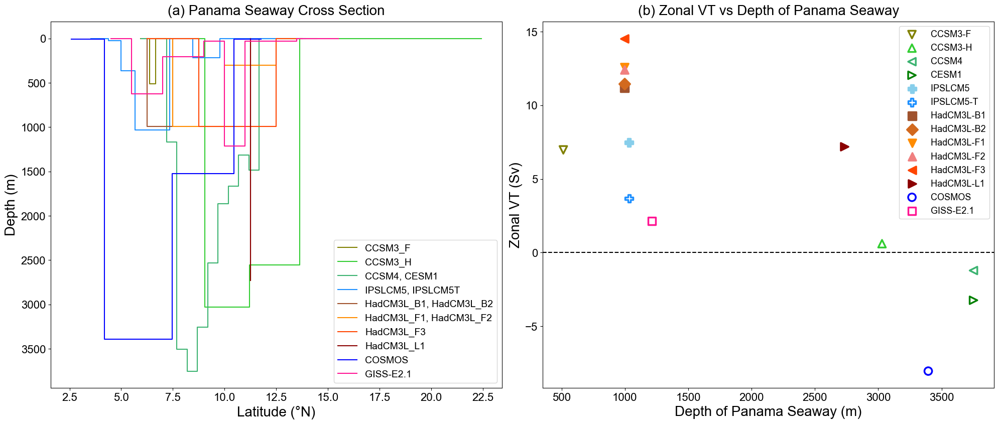

In [7]:
# font='Arial'
# plt.rc('font', family=font)

mlw=2.5
f=16
f1=14
f2=20
s=120


# markers=['1','2','3','4','P','+','<','>','v','^','<','>','o','H']
# edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
# facecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','none','none','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']

panama_vt=zonal_vt['Panama_Seaway'].to_numpy()
dep_panama=gateway_area['Panama_seaway_depth'].to_numpy()

plt.figure(figsize=[20,16])

plt.subplot(221)

style='steps-mid'
plt.plot(panama_cs[1], panama_cs[0], drawstyle=style, label='CCSM3_F',c='olive')
plt.plot(panama_cs[3], panama_cs[2], drawstyle=style, label='CCSM3_H', c='limegreen')
plt.plot(panama_cs[5], panama_cs[4], drawstyle=style, label='CCSM4, CESM1',c='mediumseagreen')
plt.plot(panama_cs[9], panama_cs[8], drawstyle=style, label='IPSLCM5, IPSLCM5T',c='dodgerblue')
plt.plot(panama_cs[13], panama_cs[12], drawstyle=style, label='HadCM3L_B1, HadCM3L_B2',c='sienna')
plt.plot(panama_cs[17], panama_cs[16], drawstyle=style, label='HadCM3L_F1, HadCM3L_F2', c='darkorange')
plt.plot(panama_cs[21], panama_cs[20], drawstyle=style, label='HadCM3L_F3',c='orangered')
plt.plot(panama_cs[23], panama_cs[22], drawstyle=style, label='HadCM3L_L1',c='darkred')
plt.plot(panama_cs[25], panama_cs[24], drawstyle=style, label='COSMOS',c='blue')
plt.plot(panama_cs[27], panama_cs[26], drawstyle=style, label='GISS-E2.1',c='deeppink')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.title('(a) Panama Seaway Cross Section',fontsize=f2, pad=10)
plt.gca().invert_yaxis()
plt.legend(fontsize=f1)
plt.xlabel('Latitude (°N)',fontsize=f2)
plt.ylabel('Depth (m)',fontsize=f2)

plt.subplot(222)
for i in range(14):
    plt.scatter(dep_panama[i],panama_vt[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)   

plt.xlabel('Depth of Panama Seaway (m)',fontsize=f2)
plt.ylabel('Zonal VT (Sv)',fontsize=f2)
plt.legend(loc=1,fontsize=13)
plt.title('(b) Zonal VT vs Depth of Panama Seaway',fontsize=f2, pad=10)
plt.axhline(y=0, color='k', linestyle='--')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.tight_layout()


plt.savefig(f'{pathf}Panama_cross_section_VT_vs_depth.pdf', dpi=300, bbox_inches='tight')



Indices for each simulation in the cross-section files: Tethys Seaway  </br>
0-ccsm3f_dep </br>
1-ccsm3f_lat </br>
2-ccsm3h_dep </br>
3-ccsm3h_lat </br>
4-ccsm4_dep </br>
5-ccsm4_lat </br>
6-cesm1_dep </br>
7-cesm1_lat </br>
8-ipslt_dep </br>
9-ipslt_lat </br>
10-cosmos_dep </br>
11-cosmos_lat </br>
12-giss_dep </br>
13-giss_lat </br>


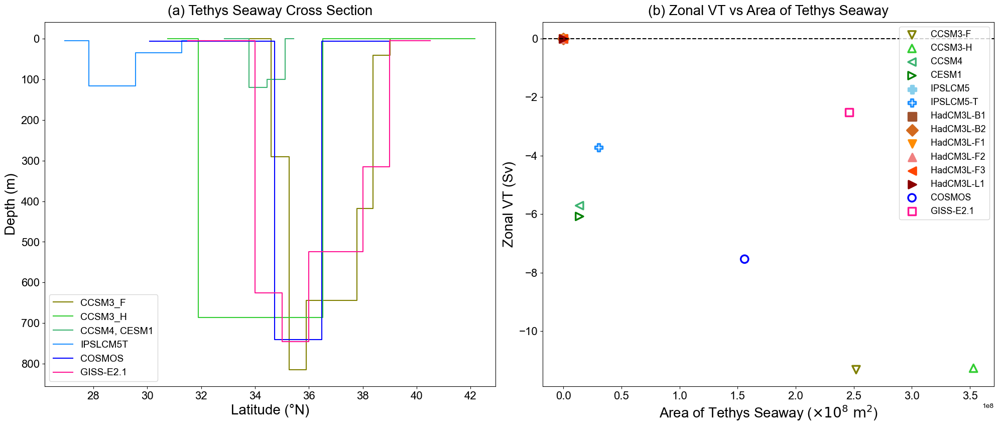

In [8]:
mlw=2.5
f=16
f1=14
f2=20
s=120


markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']

tethys_vt=zonal_vt['Tethys_Seaway'].to_numpy()
tethys_area=gateway_area['Tethys_seaway_area'].to_numpy()

plt.figure(figsize=[20,16])

plt.subplot(221)

style='steps-mid'
plt.plot(tet_cs[1], tet_cs[0], drawstyle=style, label='CCSM3_F',c='olive')
plt.plot(tet_cs[3], tet_cs[2], drawstyle=style, label='CCSM3_H', c='limegreen')
plt.plot(tet_cs[5], tet_cs[4], drawstyle=style, label='CCSM4, CESM1',c='mediumseagreen')
plt.plot(tet_cs[9], tet_cs[8], drawstyle=style, label='IPSLCM5T',c='dodgerblue')
plt.plot(tet_cs[11], tet_cs[10], drawstyle=style, label='COSMOS',c='blue')
plt.plot(tet_cs[13], tet_cs[12], drawstyle=style, label='GISS-E2.1',c='deeppink')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.title('(a) Tethys Seaway Cross Section',fontsize=f2, pad=10)
plt.gca().invert_yaxis()
plt.legend(fontsize=f1)
plt.xlabel('Latitude (°N)',fontsize=f2)
plt.ylabel('Depth (m)',fontsize=f2)

plt.subplot(222)
for i in range(14):
    plt.scatter(tethys_area[i],tethys_vt[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)   

plt.xlabel(r'Area of Tethys Seaway ($\times 10^8\ \mathrm{m}^2$)',fontsize=f2)
plt.ylabel('Zonal VT (Sv)',fontsize=f2)
plt.legend(loc=1,fontsize=13)
plt.title('(b) Zonal VT vs Area of Tethys Seaway',fontsize=f2, pad=10)
plt.axhline(y=0, color='k', linestyle='--')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.tight_layout()

plt.savefig(f'{pathf}Tethys_cross_section_VT_vs_area.pdf', dpi=300, bbox_inches='tight')


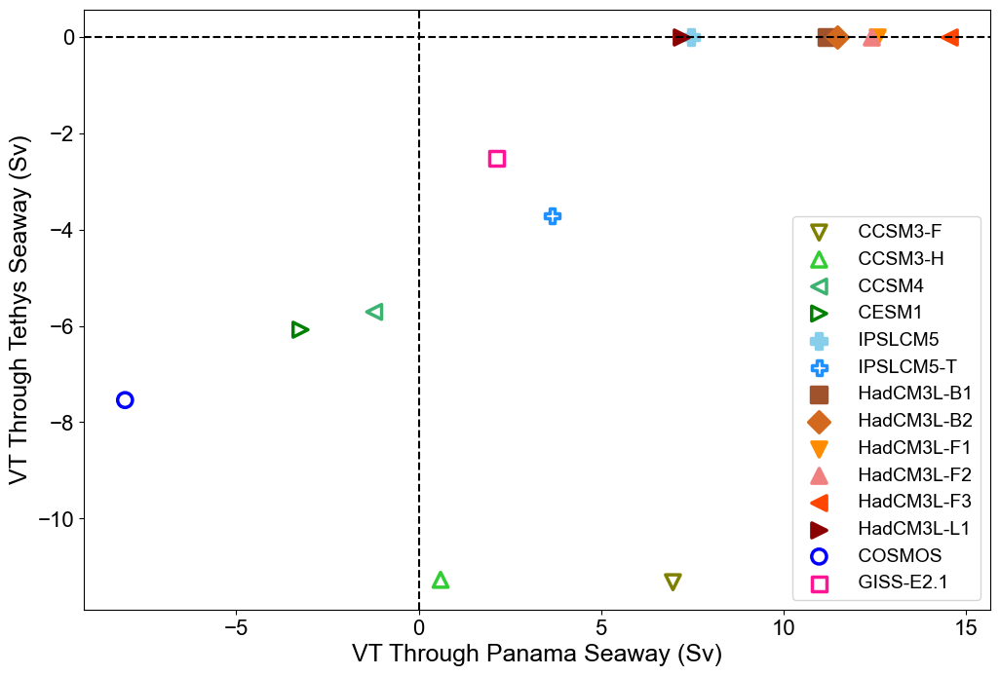

In [9]:
mlw=2.5
f=16
f1=14
f2=18
s=120

plt.figure(figsize=[12,8])

markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']

tethys_vt=zonal_vt['Tethys_Seaway'].to_numpy()
panama_vt=zonal_vt['Panama_Seaway'].to_numpy()

for i in range(14):
    plt.scatter(panama_vt[i],tethys_vt[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)   

plt.xlabel('VT Through Panama Seaway (Sv)',fontsize=f2)
plt.ylabel('VT Through Tethys Seaway (Sv)',fontsize=f2)
plt.legend(loc=4,fontsize=14)
#plt.title('(b) Zonal VT vs Area of Tethys Seaway',fontsize=f2, pad=10)
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.savefig(f'{pathf}Miocene_Panama_vs_Tethys_VT.pdf', dpi=300, bbox_inches='tight')


Indices for each simulation in the cross-section files: Drake Passage  </br>
0 - ccsm3f_dep </br>
1 - ccsm3f_lat </br>
2 - ccsm3h_dep </br>
3 - ccsm3h_lat  </br>
4 - ccsm4_dep </br>
5 - ccsm4_lat </br>
6 - cesm1_dep </br>
7 - cesm1_lat </br>
8 - ipsl_dep </br>
9 - ipsl_lat </br>
10 - ipslt_dep </br>
11 - ipslt_lat </br>
12 - hadb1_dep </br>
13 - hadb1_lat </br>
14 - hadb2_dep </br>
15 - hadb2_lat </br>
16 - hadf1_dep </br>
17 - hadf1_lat </br>
18 - hadf2_dep </br>
19 - hadf2_lat </br>
20 - hadf3_dep </br>
21 - hadf3_lat </br>
22 - hadl1_dep </br>
23 - hadl1_lat </br>
24 - cosmos_dep </br>
25 - cosmos_lat </br>
26 - giss_dep </br>
27 - giss_lat </br>


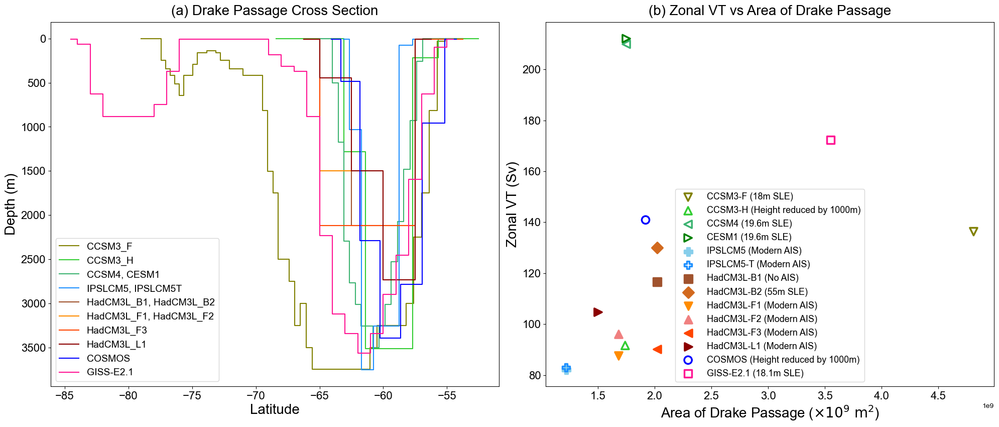

In [10]:
mlw=2.5
f=16
f1=14
f2=20
s=120


# markers=['1','2','3','4','P','+','<','>','v','^','<','>','o','H']
# edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
# facecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','none','none','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']

markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F (18m SLE)',' CCSM3-H (Height reduced by 1000m)',' CCSM4 (19.6m SLE)',' CESM1 (19.6m SLE)',' IPSLCM5 (Modern AIS)',' IPSLCM5-T (Modern AIS)',' HadCM3L-B1 (No AIS)',' HadCM3L-B2 (55m SLE)',' HadCM3L-F1 (Modern AIS)',' HadCM3L-F2 (Modern AIS)',
         ' HadCM3L-F3 (Modern AIS)',' HadCM3L-L1 (Modern AIS)',' COSMOS (Height reduced by 1000m)',' GISS-E2.1 (18.1m SLE)']

drake_vt=zonal_vt['Drake_Passage'].to_numpy()
drake_area=gateway_area['Drake_passage_area'].to_numpy()

plt.figure(figsize=[20,16])

plt.subplot(221)

style='steps-mid'
plt.plot(drake_cs[1], drake_cs[0], drawstyle=style, label='CCSM3_F',c='olive')
plt.plot(drake_cs[3], drake_cs[2], drawstyle=style, label='CCSM3_H', c='limegreen')
plt.plot(drake_cs[5], drake_cs[4], drawstyle=style, label='CCSM4, CESM1',c='mediumseagreen')
plt.plot(drake_cs[9], drake_cs[8], drawstyle=style, label='IPSLCM5, IPSLCM5T',c='dodgerblue')
plt.plot(drake_cs[13], drake_cs[12], drawstyle=style, label='HadCM3L_B1, HadCM3L_B2',c='sienna')
plt.plot(drake_cs[17], drake_cs[16], drawstyle=style, label='HadCM3L_F1, HadCM3L_F2', c='darkorange')
plt.plot(drake_cs[21], drake_cs[20], drawstyle=style, label='HadCM3L_F3',c='orangered')
plt.plot(drake_cs[23], drake_cs[22], drawstyle=style, label='HadCM3L_L1',c='darkred')
plt.plot(drake_cs[25], drake_cs[24], drawstyle=style, label='COSMOS',c='blue')
plt.plot(drake_cs[27], drake_cs[26], drawstyle=style, label='GISS-E2.1',c='deeppink')

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.title('(a) Drake Passage Cross Section',fontsize=f2, pad=10)
plt.gca().invert_yaxis()
plt.legend(fontsize=f1)
plt.xlabel('Latitude',fontsize=f2)
plt.ylabel('Depth (m)',fontsize=f2)

plt.subplot(222)
for i in range(14):
    plt.scatter(drake_area[i],drake_vt[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)   

plt.xlabel(r'Area of Drake Passage ($\times 10^9\ \mathrm{m}^2$)',fontsize=f2)
plt.ylabel('Zonal VT (Sv)',fontsize=f2)
plt.legend(fontsize=13)
plt.title('(b) Zonal VT vs Area of Drake Passage',fontsize=f2, pad=10)

plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.tight_layout()

plt.savefig(f'{pathf}Drake_cross_section_VT_vs_area.pdf', dpi=300, bbox_inches='tight')


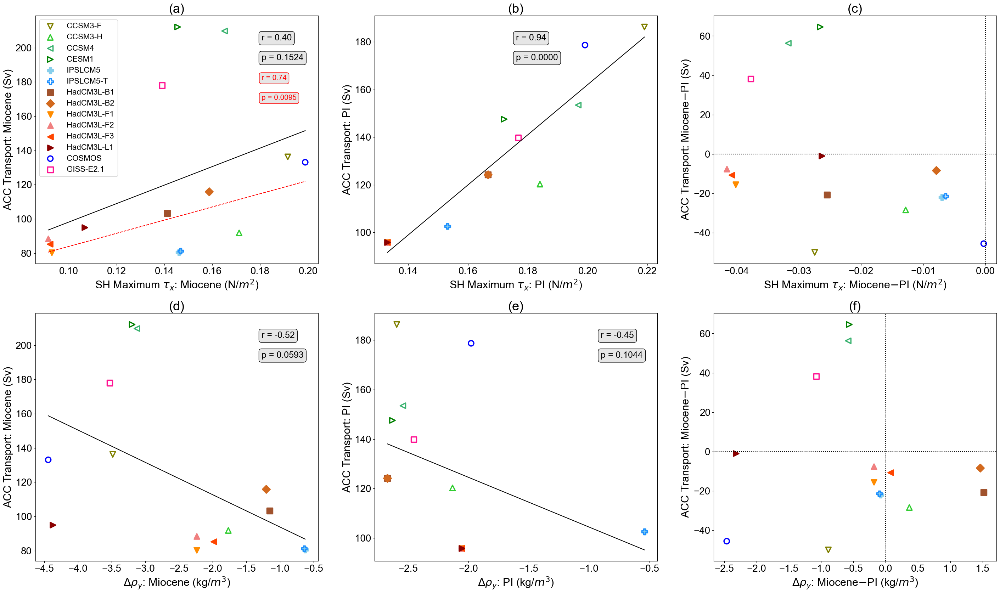

In [12]:
sh_wes_mio = meridional_gradients['Miocene_SH_westerlies'].to_numpy()
acc_drake_transp_mio = meridional_gradients['Miocene_ACC_transport'].to_numpy()
sh_wes_pi = meridional_gradients['PI_SH_westerlies'].to_numpy()
acc_drake_transp_pi = meridional_gradients['PI_ACC_transport'].to_numpy()
del_sigma2_mio = meridional_gradients['Miocene_meridional_density_difference'].to_numpy()
del_sigma2_pi = meridional_gradients['PI_meridional_density_difference'].to_numpy()
del_temp_mio = meridional_gradients['Miocene_meridional_temp_difference'].to_numpy()
del_temp_pi = meridional_gradients['PI_meridional_temp_difference'].to_numpy()
del_sal_mio = meridional_gradients['Miocene_meridional_salinity_difference'].to_numpy()
del_sal_pi = meridional_gradients['PI_meridional_salinity_difference'].to_numpy()


a0=1.67e-4  
b0=0.78e-3  # a0 = α0 and b0 = β0 are the constant coefficients of thermal expansion and haline contraction used in the simplified expression
#             of seawater EOS as per Vallis (2018) and Nycander et al. (2015). These produce realistic enough circulation as per Roquet et al. (2015)

# markers=['1','2','3','4','P','+','<','>','v','^','<','>','o','H']
# edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
# facecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','none','none','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']
c='k'
mlw=2.5
f=22
f1=20
f2=26
s=120
tb_fs=18 # textbox fontsize for annotated text
bbox = dict(boxstyle="round", fc="0.9")


plt.figure(figsize=[35,20])

plt.subplot(231)

for i in range(14):
    plt.scatter(sh_wes_mio[i],acc_drake_transp_mio[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel('SH Maximum $\u03C4_{x}$: Miocene (N/$m^2$)', fontsize=f)
plt.ylabel('ACC Transport: Miocene (Sv)', fontsize=f)
plt.legend(loc=2, fontsize=16)
plt.title('(a)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)

# Plotting regression line of all points
m, b = np.polyfit(sh_wes_mio, acc_drake_transp_mio, 1)
x_sorted = np.sort(sh_wes_mio)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(sh_wes_mio, acc_drake_transp_mio)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

# Plotting regression line excluding CCSM4, CESM1, GISS-E2.1
# Exclude indices 2, 3, and 13
exclude_indices = [2, 3, 13]
x_filtered = np.delete(sh_wes_mio, exclude_indices)
y_filtered = np.delete(acc_drake_transp_mio, exclude_indices)

# Plotting regression line with filtered data
m, b = np.polyfit(x_filtered, y_filtered, 1)
x_sorted = np.sort(x_filtered)
y_sorted = m * x_sorted + b

plt.plot(x_sorted, y_sorted, ls='--', color='red')

# Calculate Pearson correlation
r, p = stats.pearsonr(x_filtered, y_filtered)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.74), xycoords='axes fraction',
             c='r', fontsize=15, bbox=dict(boxstyle="round", fc="0.9", ec="red"))
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.66), xycoords='axes fraction',
             c='r', fontsize=15, bbox=dict(boxstyle="round", fc="0.9", ec="red"))


plt.subplot(232)

for i in range(14):
    plt.scatter(sh_wes_pi[i],acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel('SH Maximum $\u03C4_{x}$: PI (N/$m^2$)', fontsize=f)
plt.ylabel('ACC Transport: PI (Sv)', fontsize=f)
#plt.legend(loc=2, fontsize=15)
plt.title('(b)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
#plt.xlim(0.8,0.22)
m, b = np.polyfit(sh_wes_pi, acc_drake_transp_pi, 1)
x_sorted = np.sort(sh_wes_pi)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(sh_wes_pi, acc_drake_transp_pi)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.5, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.5, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)


plt.subplot(233)

for i in range(14):
    plt.scatter(sh_wes_mio[i]-sh_wes_pi[i],acc_drake_transp_mio[i]-acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel('SH Maximum $\u03C4_{x}$: Miocene$ - $PI (N/$m^2$)', fontsize=f)
plt.ylabel('ACC Transport: Miocene$ - $PI (Sv)', fontsize=f)
plt.title('(c)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.axhline(y=0,ls=':',c='k')
plt.axvline(x=0,ls=':',c='k')

plt.subplot(234)

for i in range(14):
    plt.scatter(del_sigma2_mio[i],acc_drake_transp_mio[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$\Delta \rho_{y}$: Miocene (kg/$m^3$)', fontsize=f)
plt.ylabel('ACC Transport: Miocene (Sv)', fontsize=f)
plt.title('(d)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)

m, b = np.polyfit(del_sigma2_mio, acc_drake_transp_mio, 1)
x_sorted = np.sort(del_sigma2_mio)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_sigma2_mio, acc_drake_transp_mio)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

plt.subplot(235)

for i in range(14):
    plt.scatter(del_sigma2_pi[i],acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$\Delta \rho_{y}$: PI (kg/$m^3$)', fontsize=f)
plt.ylabel('ACC Transport: PI (Sv)', fontsize=f)
plt.title('(e)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)

m, b = np.polyfit(del_sigma2_pi, acc_drake_transp_pi, 1)
x_sorted = np.sort(del_sigma2_pi)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_sigma2_pi, acc_drake_transp_pi)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

plt.subplot(236)

for i in range(14):
    plt.scatter(del_sigma2_mio[i]-del_sigma2_pi[i],acc_drake_transp_mio[i]-acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$\Delta \rho_{y}$: Miocene$ - $PI (kg/$m^3$)', fontsize=f)
plt.ylabel('ACC Transport: Miocene$ - $PI (Sv)', fontsize=f)
plt.title('(f)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.axhline(y=0,ls=':',c='k')
plt.axvline(x=0,ls=':',c='k')



plt.savefig(f'{pathf}Miocene_PI_SH_taux_meridional_density_gradients.pdf', dpi=300, bbox_inches='tight')


## Supporting Information

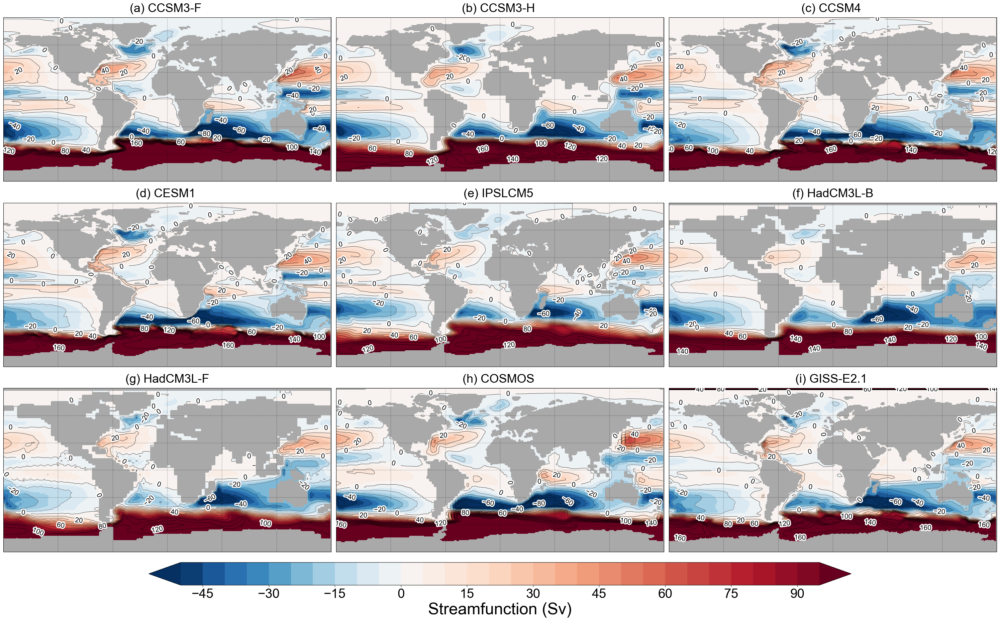

In [13]:
fig = plt.figure(figsize=[30, 17])

# Define the data (only the arrays)
bsf_data = bsf_pi.BSF

# Titles and tick configurations
titles = ['(a) CCSM3-F ','(b) CCSM3-H ','(c) CCSM4 ','(d) CESM1 ','(e) IPSLCM5 ','(f) HadCM3L-B','(g) HadCM3L-F','(h) COSMOS ','(i) GISS-E2.1 ']

left_ticks = [True, False, False, True, False, False, True, False, False, True, False, False, True, False]

norm = colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100)
levels = np.arange(-50, 100, 5)
con_levels = np.arange(-100, 180, 10)
label_levels = con_levels[::2]
cmap = 'RdBu_r'
facecolour = "darkgray"
f1, f, f2, pad = 26, 19, 15, 12
lats, lons = (-90, 90), (-180, 180)
con_color = 'k'
lw, conlw, insp = 5, 0.5, 10
projection = ccrs.PlateCarree()

# Loop through the data and create subplots
for idx, data in enumerate(bsf_data):
    data = data.assign_coords(lon=((data.lon + 180) % 360 - 180))
    data = data.sortby('lon')

    ax = plt.subplot(3, 3, idx + 1, projection=projection)
    bsf = ax.contourf(data.lon, data.lat, data, cmap=cmap, levels=levels, norm=norm, extend='both')
    bsf_con = ax.contour(data.lon, data.lat, data, levels=con_levels, linewidths=conlw, colors='k')
    clbls = ax.clabel(bsf_con, levels=label_levels, inline=1, fontsize=f2, colors=con_color, rightside_up=True, inline_spacing=insp)
    plt.setp(clbls, path_effects=[patheffects.withStroke(linewidth=lw, foreground="w")])
    plt.gca().set_facecolor(facecolour)
    plt.title(titles[idx], fontsize=f1, pad=pad)
    gline(ax, b=(idx >= 6), l=left_ticks[idx], tick_size=f)
    ax.set_xlim([-180, 180])
    ax.set_ylim(lats)

# Add colorbar
cbar2_ax = fig.add_axes([0.15, -0.035, 0.7, 0.04])
cbar1 = fig.colorbar(bsf, cax=cbar2_ax, extend='both', orientation='horizontal')
cbar1.ax.tick_params(labelsize=28)
cbar1.set_label('Streamfunction (Sv)', fontsize=35)

# Add overall title
#fig.suptitle('Horizontal Barotropic Streamfunction - PI', x=0.515, y=1, fontsize=38)

plt.tight_layout()

plt.savefig(f'{pathf}BSF_PI.pdf', dpi=300, bbox_inches='tight')


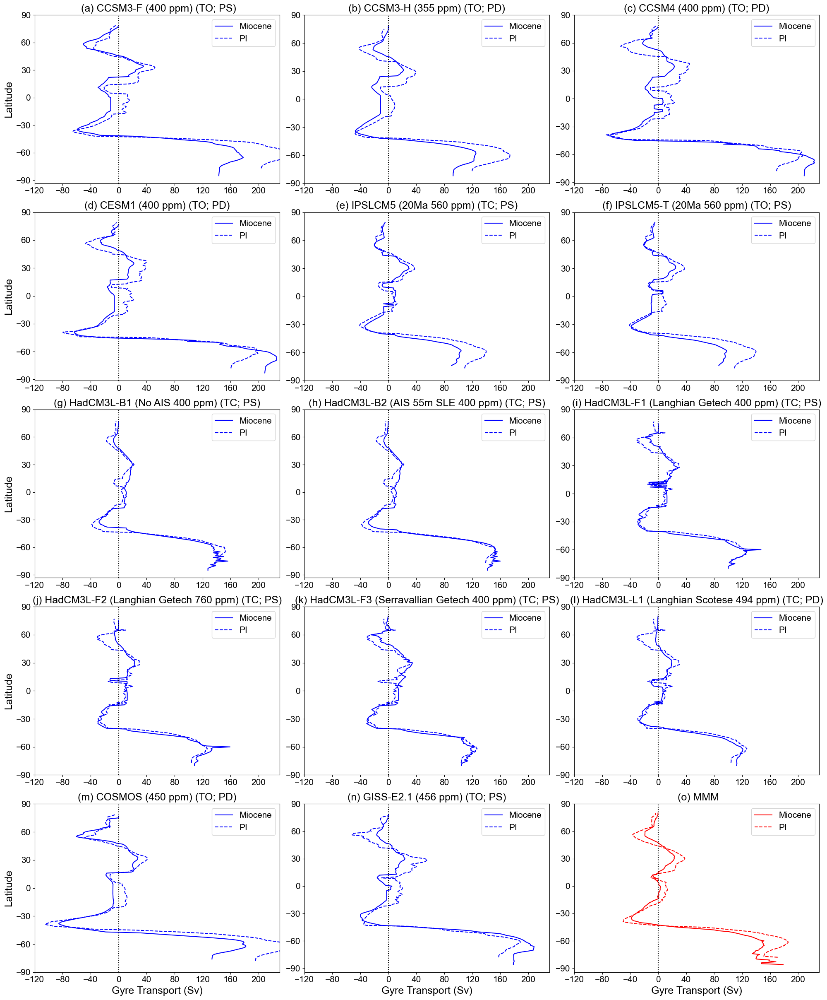

In [14]:
#fig=plt.figure(figsize=[22,35])
norm = colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100)
level=np.arange(-50,100,5)
leftticks=True;bottomticks=True
#norm=colors.CenteredNorm()
cmap='RdBu_r';facecolour="darkgray";f1=18;f=12;f2=15;pad=10
lat1=0;lat2=180
lon1=110;lon2=290
con_color='k'
lw=5
# labels=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

labels = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

bsf_atl_max_pi_plot=np.array([bsf_atl_max_pi[0], 
                  bsf_atl_max_pi[1],
                  bsf_atl_max_pi[2],
                  bsf_atl_max_pi[3],
                  bsf_atl_max_pi[4],
                  bsf_atl_max_pi[4],
                  bsf_atl_max_pi[5],
                  bsf_atl_max_pi[5],
                  bsf_atl_max_pi[6],
                  bsf_atl_max_pi[6],
                  bsf_atl_max_pi[6],
                  bsf_atl_max_pi[6],
                  bsf_atl_max_pi[7],
                  bsf_atl_max_pi[8]
                  ])
left_ticks = [True, False, False, True, False, False, True, False, False, True, False, False, True, False]

# Create a figure and a grid of subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 25))  # 5 rows, 3 columns

# Loop over each subplot
for i in range(14):
    row = i // 3
    col = i % 3
    ax = axs[row, col]

    ax.plot(bsf_atl_max_mio[i], bsf_atl_max_mio.lat,'b-', label='Miocene')
    ax.plot(bsf_atl_max_pi_plot[i], bsf_atl_max_mio.lat,'b--', label='PI')
    ax.axvline(x=0, color='k', linestyle=':')
    ax.set_title(labels[i], fontsize=f1)
    ax.legend(fontsize=f2)
    ax.set_xticks(np.arange(-120, 230, 40))
    ax.set_yticks(np.arange(-90, 91, 30))
    ax.tick_params(axis='both', labelsize=f2)
    ax.set_xlim(-120, 230)
    # Add axis labels to only edge plots
    if col == 0:
        ax.set_ylabel('Latitude', fontsize=f1)
    if row == 4:
        ax.set_xlabel('Gyre Transport (Sv)', fontsize=f1)


# Final MMM subplot
axs[4, 2].plot(np.nanmean(bsf_atl_max_mio, axis=0), bsf_atl_max_mio.lat, 'r-', label='Miocene')
axs[4, 2].plot(np.nanmean(bsf_atl_max_pi, axis=0), bsf_atl_max_mio.lat, 'r--', label='PI')
axs[4, 2].axvline(x=0, color='k', linestyle=':')
axs[4, 2].set_title(' (o) MMM', fontsize=f1)
axs[4, 2].legend(fontsize=f2)
axs[4, 2].set_xlabel("Gyre Transport (Sv)", fontsize=f1)
axs[4, 2].set_xlim(-120, 230)
axs[4, 2].set_xticks(np.arange(-120, 230, 40))
axs[4, 2].set_yticks(np.arange(-90, 91, 30))
axs[4, 2].tick_params(axis='both', labelsize=f2)
# Remove duplicate Y labels in MMM subplot
#axs[4, 2].set_yticklabels([])

# Suptitle
#fig.suptitle('Gyre Strength - Atlantic ', x=0.515, y=0.99, fontsize=25)

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle

plt.savefig(f'{pathf}Mio_PI_Atlantic_Gyre_strength.pdf', dpi=300, bbox_inches='tight')


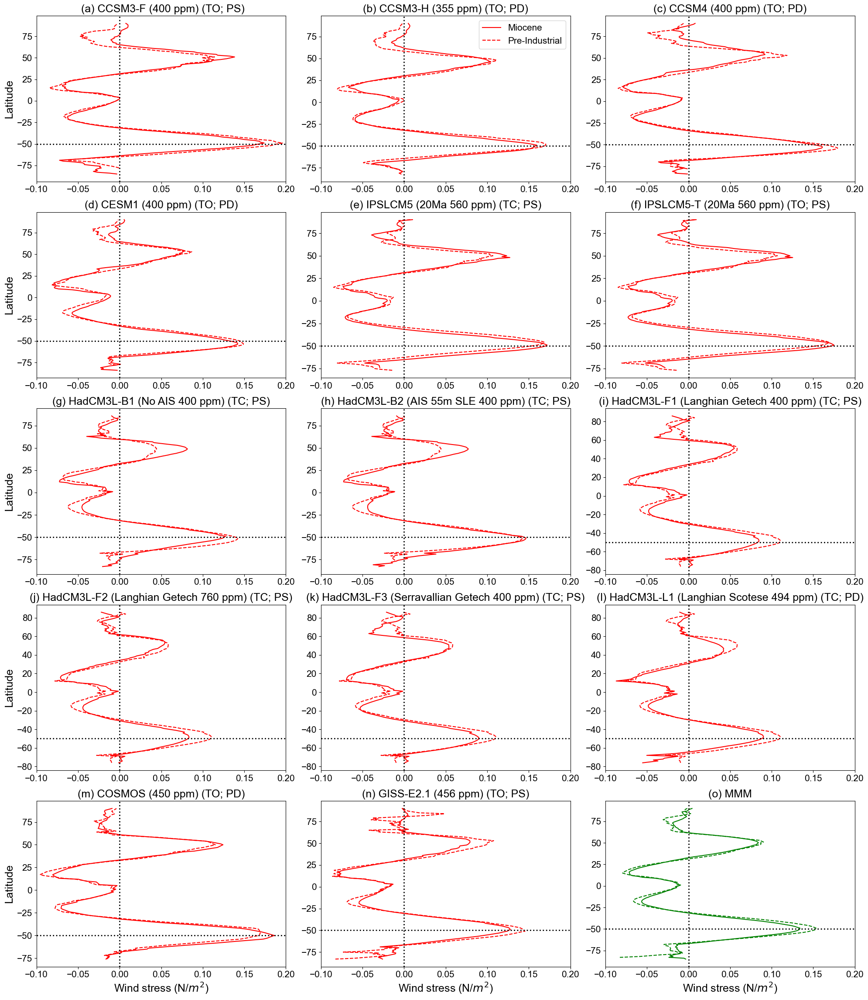

In [15]:
## Plotting zonal average wind stress - Atlantic


taux_mio_atl=bsf_mio.Taux_Mio_atl
taux_pi_atl=np.array([bsf_pi.Taux_PI_atl[0], 
             bsf_pi.Taux_PI_atl[1],
             bsf_pi.Taux_PI_atl[2],
             bsf_pi.Taux_PI_atl[3],
             bsf_pi.Taux_PI_atl[4],
             bsf_pi.Taux_PI_atl[4],
             bsf_pi.Taux_PI_atl[5],
             bsf_pi.Taux_PI_atl[5],
             bsf_pi.Taux_PI_atl[6],
             bsf_pi.Taux_PI_atl[6],
             bsf_pi.Taux_PI_atl[6],
             bsf_pi.Taux_PI_atl[6],
             bsf_pi.Taux_PI_atl[7],
             bsf_pi.Taux_PI_atl[8]
             ])

leftticks=True;bottomticks=True
cmap='RdBu_r';facecolour="darkgray";f1=18;f=12;f2=15;pad=10
lats =(-20, 90)
lons =(-110,30)
lw=2
ls1='r-'  #miocene
ls2='r--' #PI


# labels1=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

labels1 = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']


labels=['(a) CCSM3-F','(b) CCSM3-H','(c) CCSM4','(d) CESM1','(e) IPSLCM5','(f) IPSLCM5-T','(g) HadCM3L-B1','(h) HadCM3L-B2','(i) HadCM3L-F1',
        '(j) HadCM3L-F2','(k) HadCM3L-F3','(l) HadCM3L-L1','(m) COSMOS','(n) GISS']#

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 23))

for i, ax in enumerate(axes.flat):
    if i < len(bsf_mio.sim):
        ax.plot(taux_mio_atl[i], bsf_mio.lat, ls1, label='Miocene')
        ax.plot(taux_pi_atl[i], bsf_mio.lat, ls2, label='Pre-Industrial')
        ax.set_title(labels1[i], fontsize=f1)
        ax.axvline(x=0, color='k', linestyle=':', lw=lw)
        ax.axhline(y=-50, color='k', linestyle=':', lw=lw)
        ax.set_xlim(-0.1, 0.2)
        ax.tick_params(axis='both', labelsize=f2)

        row, col = divmod(i, 3)
        if row == 4:
            ax.set_xlabel('Wind stress (N/$m^2$)', fontsize=f1)
        if col == 0:
            ax.set_ylabel('Latitude', fontsize=f1)

        if i == 1:
            ax.legend(fontsize=f2)
    else:
        ax.axis('off')

# Add final MMM subplot
final_ax = fig.add_subplot(5, 3, 15)  # position 15 = bottom right corner
final_ax.plot(bsf_mio.Taux_Mio_atl.mean(dim='sim'), bsf_mio.lat, 'g-', label='Miocene')
final_ax.plot(bsf_pi.Taux_PI_atl.mean(dim='sim'), bsf_mio.lat, 'g--', label='Pre-Industrial')
final_ax.set_title('(o) MMM', fontsize=f1)
final_ax.axvline(x=0, color='k', linestyle=':', lw=lw)
final_ax.axhline(y=-50, color='k', linestyle=':', lw=lw)
final_ax.set_xlim(-0.1, 0.2)
final_ax.set_xlabel('Wind stress (N/$m^2$)', fontsize=f1)
final_ax.tick_params(axis='both', labelsize=f2)

#fig.suptitle('Average Zonal Wind Stress ($\u03C4_{x}$) - Atlantic', x=0.515, y=0.99, fontsize=28)
plt.tight_layout()

plt.savefig(f'{pathf}Mio_PI_Atlantic_Zonal_wind_stress.pdf', dpi=300, bbox_inches='tight')


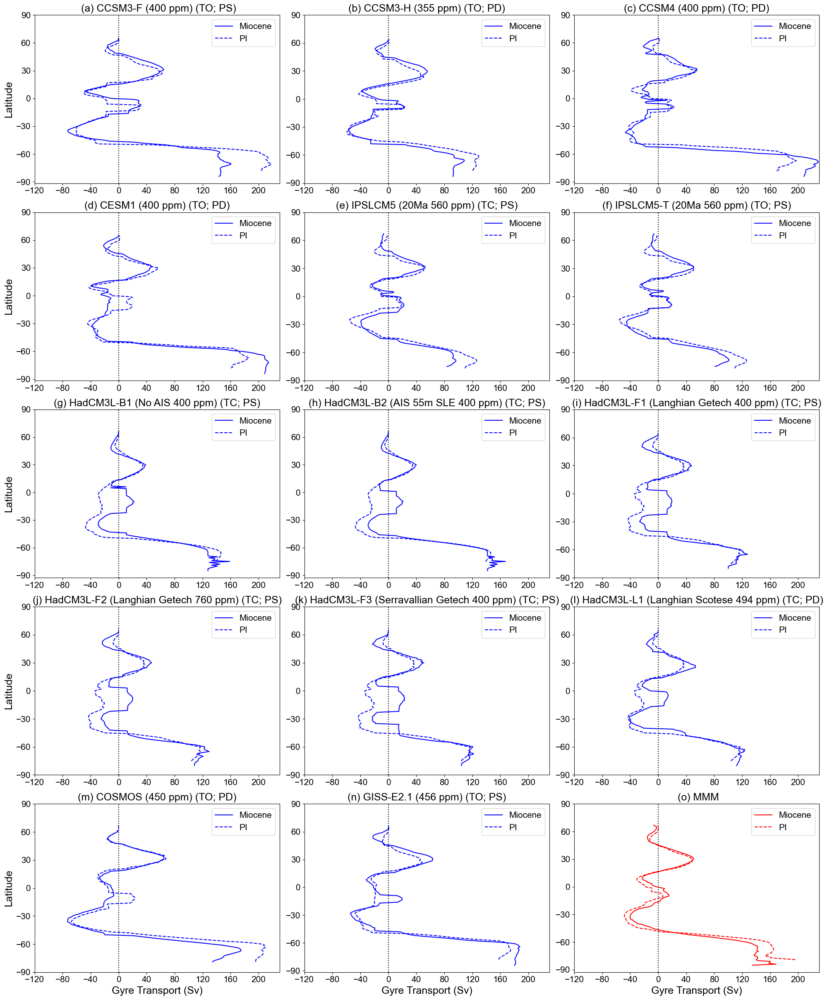

In [16]:
#fig=plt.figure(figsize=[22,35])
norm = colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=100)
level=np.arange(-50,100,5)
leftticks=True;bottomticks=True
#norm=colors.CenteredNorm()
cmap='RdBu_r';facecolour="darkgray";f1=18;f=12;f2=15;pad=10
lat1=0;lat2=180
lon1=110;lon2=290
con_color='k'
lw=5
# labels=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

labels = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

bsf_pac_max_pi_plot=np.array([bsf_pac_max_pi[0], 
                  bsf_pac_max_pi[1],
                  bsf_pac_max_pi[2],
                  bsf_pac_max_pi[3],
                  bsf_pac_max_pi[4],
                  bsf_pac_max_pi[4],
                  bsf_pac_max_pi[5],
                  bsf_pac_max_pi[5],
                  bsf_pac_max_pi[6],
                  bsf_pac_max_pi[6],
                  bsf_pac_max_pi[6],
                  bsf_pac_max_pi[6],
                  bsf_pac_max_pi[7],
                  bsf_pac_max_pi[8]
                  ])
left_ticks = [True, False, False, True, False, False, True, False, False, True, False, False, True, False]

# Create a figure and a grid of subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 25))  # 5 rows, 3 columns

# Loop over each subplot
for i in range(14):
    row = i // 3
    col = i % 3
    ax = axs[row, col]

    ax.plot(bsf_pac_max_mio[i], bsf_pac_max_mio.lat,'b-', label='Miocene')
    ax.plot(bsf_pac_max_pi_plot[i], bsf_pac_max_mio.lat,'b--', label='PI')
    ax.axvline(x=0, color='k', linestyle=':')
    ax.set_title(labels[i], fontsize=f1)
    ax.legend(fontsize=f2)
    ax.set_xticks(np.arange(-120, 230, 40))
    ax.set_yticks(np.arange(-90, 91, 30))
    ax.tick_params(axis='both', labelsize=f2)
    ax.set_xlim(-120, 230)
    # Add axis labels to only edge plots
    if col == 0:
        ax.set_ylabel('Latitude', fontsize=f1)
    if row == 4:
        ax.set_xlabel('Gyre Transport (Sv)', fontsize=f1)


# Final MMM subplot
axs[4, 2].plot(np.nanmean(bsf_pac_max_mio, axis=0), bsf_pac_max_mio.lat, 'r-', label='Miocene')
axs[4, 2].plot(np.nanmean(bsf_pac_max_pi, axis=0), bsf_pac_max_mio.lat, 'r--', label='PI')
axs[4, 2].axvline(x=0, color='k', linestyle=':')
axs[4, 2].set_title(' (o) MMM', fontsize=f1)
axs[4, 2].legend(fontsize=f2)
axs[4, 2].set_xlabel("Gyre Transport (Sv)", fontsize=f1)
axs[4, 2].set_xlim(-120, 230)
axs[4, 2].set_xticks(np.arange(-120, 230, 40))
axs[4, 2].set_yticks(np.arange(-90, 91, 30))
axs[4, 2].tick_params(axis='both', labelsize=f2)
# Remove duplicate Y labels in MMM subplot
#axs[4, 2].set_yticklabels([])

# Suptitle
#fig.suptitle('Gyre Strength - Pacific ', x=0.515, y=0.99, fontsize=25)

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle

plt.savefig(f'{pathf}Mio_PI_Pacific_Gyre_strength.pdf', dpi=300, bbox_inches='tight')


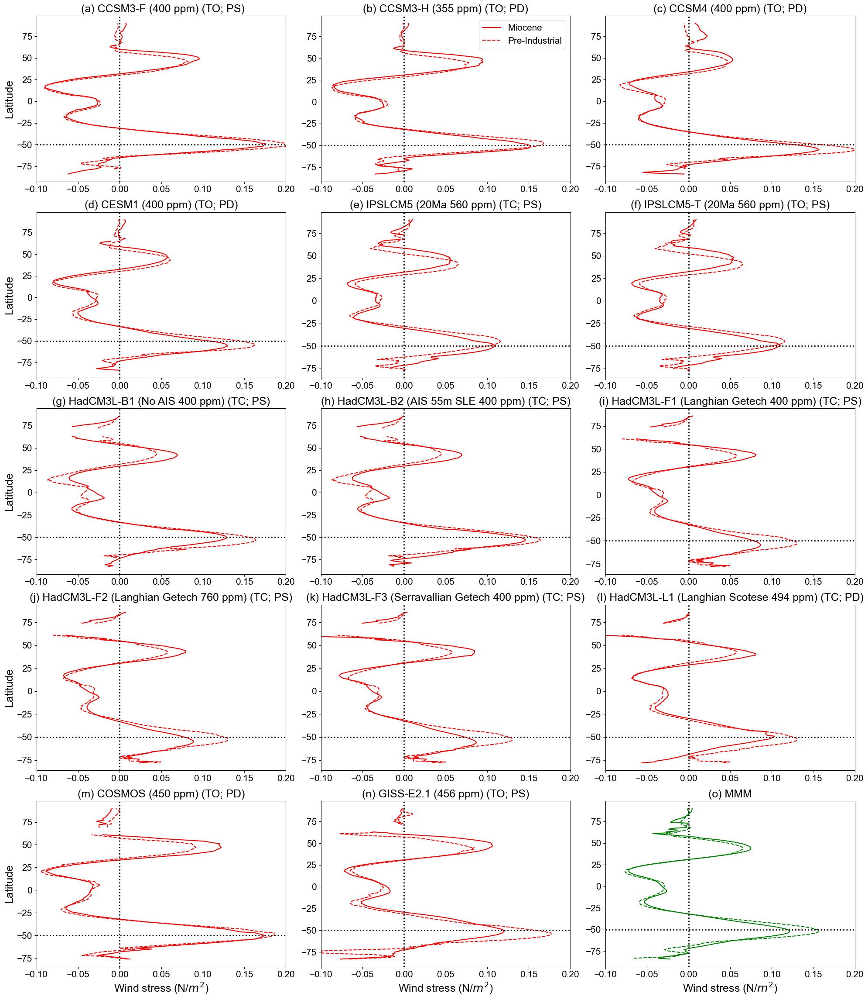

In [17]:
## Plotting zonal average wind stress curl - Pacific


taux_mio_pac=bsf_mio.Taux_Mio_pac
taux_pi_pac=np.array([bsf_pi.Taux_PI_pac[0], 
             bsf_pi.Taux_PI_pac[1],
             bsf_pi.Taux_PI_pac[2],
             bsf_pi.Taux_PI_pac[3],
             bsf_pi.Taux_PI_pac[4],
             bsf_pi.Taux_PI_pac[4],
             bsf_pi.Taux_PI_pac[5],
             bsf_pi.Taux_PI_pac[5],
             bsf_pi.Taux_PI_pac[6],
             bsf_pi.Taux_PI_pac[6],
             bsf_pi.Taux_PI_pac[6],
             bsf_pi.Taux_PI_pac[6],
             bsf_pi.Taux_PI_pac[7],
             bsf_pi.Taux_PI_pac[8]
             ])

leftticks=True;bottomticks=True
cmap='RdBu_r';facecolour="darkgray";f1=18;f=12;f2=15;pad=10
lats =(-20, 90)
lons =(-110,30)
lw=2
ls1='r-'  #miocene
ls2='r--' #PI


# labels1=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

labels1 = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

labels=['(a) CCSM3-F','(b) CCSM3-H','(c) CCSM4','(d) CESM1','(e) IPSLCM5','(f) IPSLCM5-T','(g) HadCM3L-B1','(h) HadCM3L-B2','(i) HadCM3L-F1',
        '(j) HadCM3L-F2','(k) HadCM3L-F3','(l) HadCM3L-L1','(m) COSMOS','(n) GISS']#

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 23))

for i, ax in enumerate(axes.flat):
    if i < len(bsf_mio.sim):
        ax.plot(taux_mio_pac[i], bsf_mio.lat, ls1, label='Miocene')
        ax.plot(taux_pi_pac[i], bsf_mio.lat, ls2, label='Pre-Industrial')
        ax.set_title(labels1[i], fontsize=f1)
        ax.axvline(x=0, color='k', linestyle=':', lw=lw)
        ax.axhline(y=-50, color='k', linestyle=':', lw=lw)
        ax.set_xlim(-0.1, 0.2)
        ax.tick_params(axis='both', labelsize=f2)

        row, col = divmod(i, 3)
        if row == 4:
            ax.set_xlabel('Wind stress (N/$m^2$)', fontsize=f1)
        if col == 0:
            ax.set_ylabel('Latitude', fontsize=f1)

        if i == 1:
            ax.legend(fontsize=f2)
    else:
        ax.axis('off')

# Add final MMM subplot
final_ax = fig.add_subplot(5, 3, 15)  # position 15 = bottom right corner
final_ax.plot(bsf_mio.Taux_Mio_pac.mean(dim='sim'), bsf_mio.lat, 'g-', label='Miocene')
final_ax.plot(bsf_pi.Taux_PI_pac.mean(dim='sim'), bsf_mio.lat, 'g--', label='Pre-Industrial')
final_ax.set_title('(o) MMM', fontsize=f1)
final_ax.axvline(x=0, color='k', linestyle=':', lw=lw)
final_ax.axhline(y=-50, color='k', linestyle=':', lw=lw)
final_ax.set_xlim(-0.1, 0.2)
final_ax.set_xlabel('Wind stress (N/$m^2$)', fontsize=f1)
final_ax.tick_params(axis='both', labelsize=f2)

#fig.suptitle('Average Zonal Wind Stress ($\u03C4_{x}$) - Pacific', x=0.515, y=0.99, fontsize=28)
plt.tight_layout()

plt.savefig(f'{pathf}Mio_PI_Pacific_zonal_wind_stress.pdf', dpi=300, bbox_inches='tight')


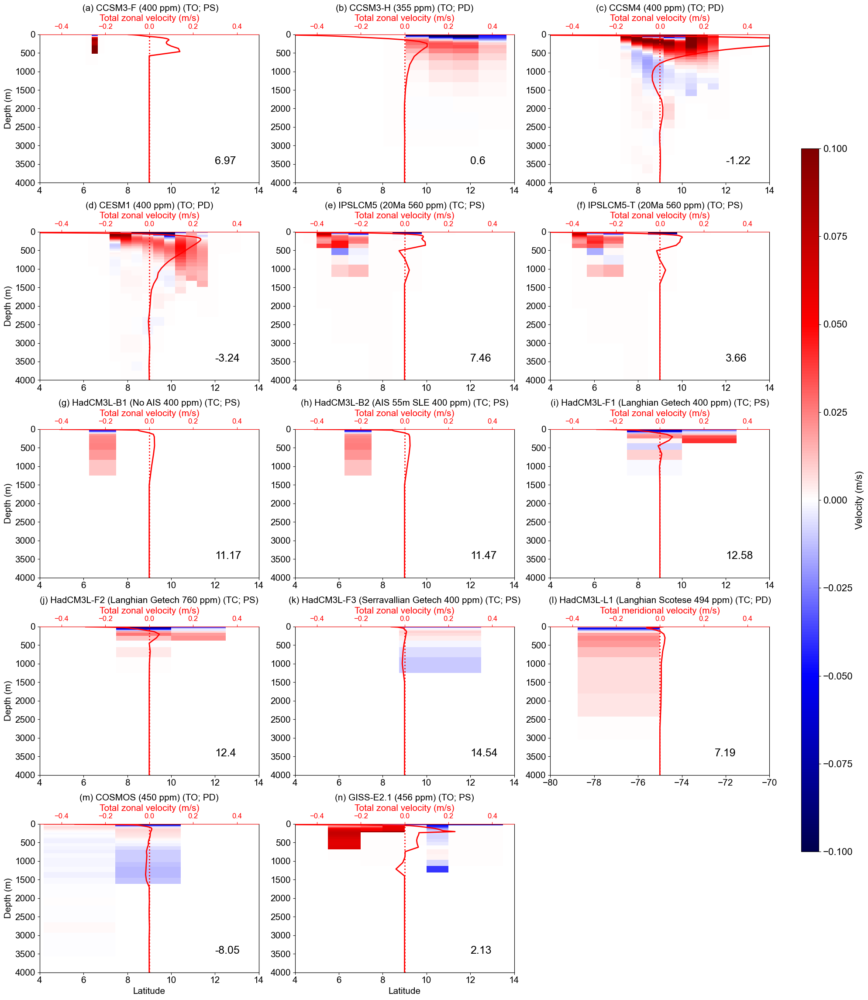

In [18]:
lats=[panama_cs[1], panama_cs[3], panama_cs[5], panama_cs[7], panama_cs[9], panama_cs[11], panama_cs[13], panama_cs[15],
      panama_cs[17], panama_cs[19], panama_cs[21], panama_cs[28]-360, panama_cs[25], panama_cs[27]]
depth_sim=[panama_csU[1], panama_csU[3], panama_csU[5], panama_csU[7], panama_csU[9], panama_csU[11], panama_csU[13], panama_csU[15],
      panama_csU[17], panama_csU[19], panama_csU[21], panama_csU[23], panama_csU[25], panama_csU[27]]
panama_cross_sec=[panama_csU[0], panama_csU[2], panama_csU[4], panama_csU[6], panama_csU[8], panama_csU[10], panama_csU[12], panama_csU[14],
      panama_csU[16], panama_csU[18], panama_csU[20], panama_csU[22], panama_csU[24], panama_csU[26]]
panama_vt=zonal_vt['Panama_Seaway'].to_numpy()

f1=15;f2=18
plots = []
levels = np.linspace(-0.1, 0.1, 21)  # Define color levels
norm = TwoSlopeNorm(vmin=-0.1, vcenter=0, vmax=0.1)  # Normalize the color scale with zero in the center
facecolour='white'

# labels1=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']

labels1 = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 23))
plots = []

for i, ax in enumerate(axes.flat):
    if i < len(depth_sim):
        row, col = divmod(i, 3)
        
        plot = ax.pcolormesh(lats[i], depth_sim[i], panama_cross_sec[i], cmap='seismic', norm=norm)
        ax.set_title(labels1[i], fontsize=f1)
        plt.gca().set_facecolor(facecolour)
        
        # Add x-axis label only on the bottom row
        if row == 4:
            if i != 11:
                ax.set_xlabel('Latitude', fontsize=f1)
            else:
                ax.set_xlabel('Longitude', fontsize=f1)

        # Add y-axis label only on the leftmost column
        if col == 0:
            ax.set_ylabel('Depth (m)', fontsize=f1)

        ax.set_xlim([4, 14] if i != 11 else [-80, -70])  # Adjust limits based on plot type
        ax.set_ylim([4000, 0])
        ax.tick_params(axis='both', labelsize=f1)
        ax.annotate(panama_vt[i], xy=(12 if i != 11 else -72.5, 3500), fontsize=f2)
        plots.append(plot)

        # Secondary x-axis for zonal/meridional velocity profile
        secax_y = ax.twiny()
        secax_y.plot(np.nansum(panama_cross_sec[i], axis=1), depth_sim[i], color='red', linestyle='-', linewidth=2, alpha=1)
        secax_y.set_xlim([-0.5, 0.5])
        secax_y.axvline(x=0, color='r', linestyle=':', lw=2)
        secax_y.set_xlabel('Total {} velocity (m/s)'.format('zonal' if i != 11 else 'meridional'), fontsize=f1)
        secax_y.spines['top'].set_color('red')
        secax_y.xaxis.label.set_color('red')
        secax_y.tick_params(axis='x', colors='red', labelsize=12)
    else:
        ax.axis('off')

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(plots[0], cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('Velocity (m/s)', fontsize=16)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Space for colorbar

plt.savefig(f'{pathf}Panama_cross_section_zonal_velocities.pdf', dpi=300, bbox_inches='tight')


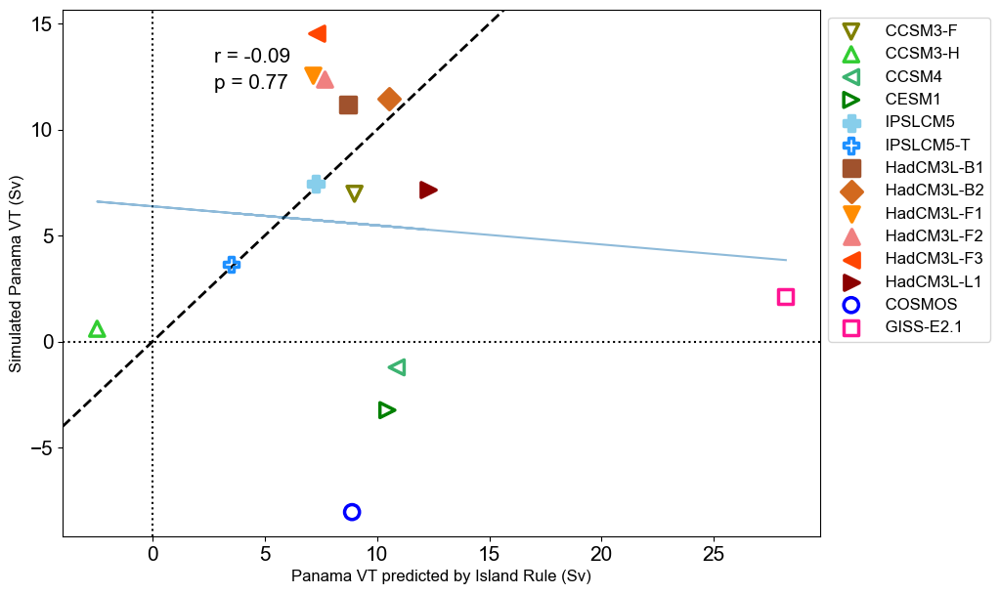

In [19]:
thetaSA=island_rule['Theta_SA'].to_numpy()
thetaS=island_rule['Theta_S'].to_numpy()
thetaD=island_rule['Theta_D'].to_numpy()
integral_tau=island_rule['Integral_tau'].to_numpy()
tethys_vt=zonal_vt['Tethys_Seaway'].to_numpy()
panama_vt=zonal_vt['Panama_Seaway'].to_numpy()
drake_vt=zonal_vt['Drake_Passage'].to_numpy()
omega=7.5*1e-5
rho0=1.0*1e3

delta=(np.sin(np.deg2rad(thetaSA))-np.sin(np.deg2rad(thetaD)))/ (np.sin(np.deg2rad(thetaS))-np.sin(np.deg2rad(thetaSA)))

# Plotting Tethys VT + delta*Drake VT vs. Panama VT
phiTdphiD=tethys_vt+(delta*drake_vt)


omega=7.5*1e-5
rho0=1.0*1e3

del_tau=integral_tau/(2*omega*rho0*(np.sin(np.deg2rad(thetaSA))-np.sin(np.deg2rad(thetaS))))
phiP = phiTdphiD + del_tau

markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']


labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']

n=14 # simulations to include


fig, ax = plt.subplots(figsize=[10, 7])
for i in range(n):
    ax.scatter(phiP[i],panama_vt[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)   

#n=11
ax.set_xlabel('Panama VT predicted by Island Rule (Sv)',fontsize=f)
ax.set_ylabel('Simulated Panama VT (Sv)',fontsize=f)
ax.legend(fontsize=12,bbox_to_anchor=(1, 1))# bbox_to_anchor=(0.8, 0.1)
ax.tick_params(labelsize=f1)
plt.axvline(x=0, color='k', linestyle=':')
plt.axhline(y=0, color='k', linestyle=':')
m, b = np.polyfit(phiP[0:n], panama_vt[0:n], 1)
plt.plot(phiP[0:n], m*phiP[0:n]+b, alpha=0.5)
r, p = stats.pearsonr(phiP[0:n], panama_vt[0:n])
plt.annotate('r = {:.2f}'.format(r), xy=(0.2,0.9), xycoords='axes fraction',fontsize=15)
plt.annotate('p = {:.2f}'.format(p), xy=(0.2,0.85), xycoords='axes fraction',fontsize=15)
plt.axline((0, 0), (1, 1), linewidth=2, color='k', ls='--',zorder=0)

plt.savefig(f'{pathf}Island_rule_Panama_VT.pdf', dpi=300, bbox_inches='tight')


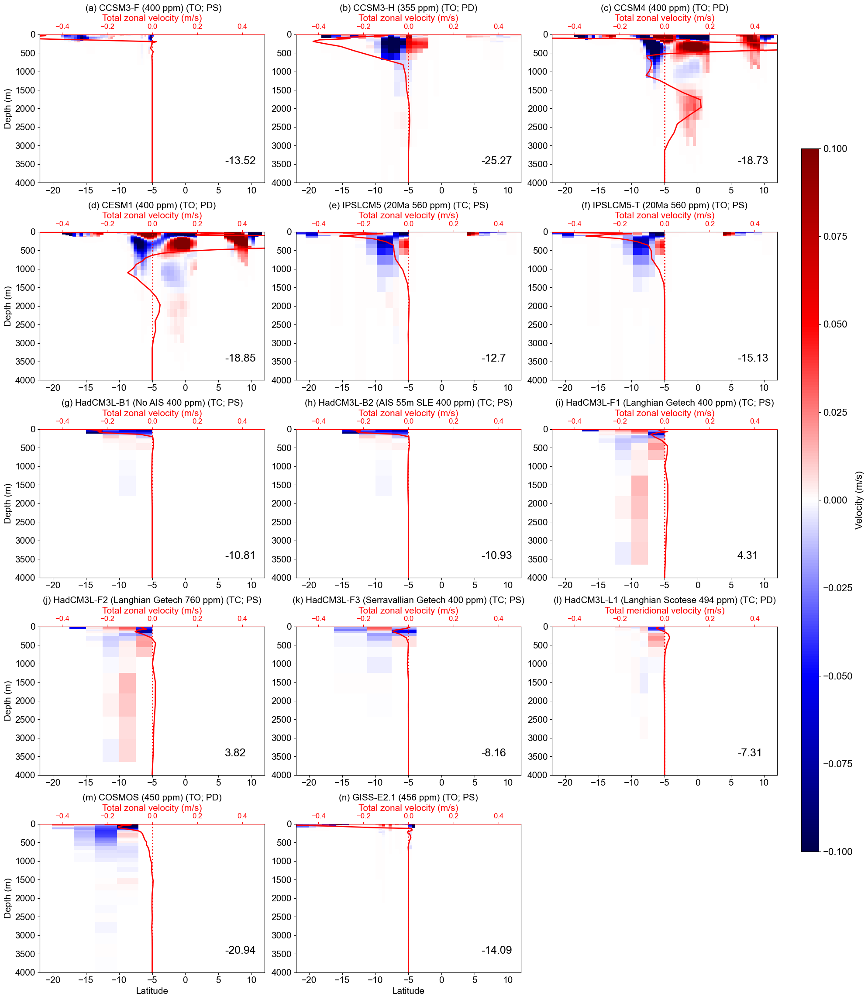

In [20]:
depth_sim=[itf_csU[1], itf_csU[3], itf_csU[5], itf_csU[7], itf_csU[9], itf_csU[11], itf_csU[13], itf_csU[15],
      itf_csU[17], itf_csU[19], itf_csU[21], itf_csU[23], itf_csU[25], itf_csU[27]]
itf_cross_sec=[itf_csU[0], itf_csU[2], itf_csU[4], itf_csU[6], itf_csU[8], itf_csU[10], itf_csU[12], itf_csU[14],
      itf_csU[16], itf_csU[18], itf_csU[20], itf_csU[22], itf_csU[24], itf_csU[26]]
itf_vt=zonal_vt['Indonesian_Gateway'].to_numpy()

f1=15;f2=18
plots = []
levels = np.linspace(-0.1, 0.1, 21)  # Define color levels
norm = TwoSlopeNorm(vmin=-0.1, vcenter=0, vmax=0.1)  # Normalize the color scale with zero in the center
facecolour='white'

# labels1=[' (a) CCSM3-F (400 ppm)','(b) CCSM3-H (355 ppm)','(c) CCSM4 (400 ppm)','(d) CESM1 (400 ppm)','(e) IPSLCM5 (20Ma Tethys Closed 560 ppm)',
#         '(f) IPSLCM5-T (20Ma Tethys Open 560 ppm)','(g) HadCM3L-B1 (No AIS 400 ppm)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm)',
#         '(i) HadCM3L-F1 (Langhian Getech 400 ppm)','(j) HadCM3L-F2 (Langhian Getech 760 ppm)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm)',
#         '(l) HadCM3L-L1 (Langhian Scotese 494 ppm)','(m) COSMOS (450 ppm)','(n) GISS-E2.1 (456 ppm)']
labels1 = [' (a) CCSM3-F (400 ppm) (TO; PS)','(b) CCSM3-H (355 ppm) (TO; PD)','(c) CCSM4 (400 ppm) (TO; PD)','(d) CESM1 (400 ppm) (TO; PD)','(e) IPSLCM5 (20Ma 560 ppm) (TC; PS)',
        '(f) IPSLCM5-T (20Ma 560 ppm) (TO; PS)','(g) HadCM3L-B1 (No AIS 400 ppm) (TC; PS)','(h) HadCM3L-B2 (AIS 55m SLE 400 ppm) (TC; PS)',
        '(i) HadCM3L-F1 (Langhian Getech 400 ppm) (TC; PS)','(j) HadCM3L-F2 (Langhian Getech 760 ppm) (TC; PS)','(k) HadCM3L-F3 (Serravallian Getech 400 ppm) (TC; PS)',
        '(l) HadCM3L-L1 (Langhian Scotese 494 ppm) (TC; PD)','(m) COSMOS (450 ppm) (TO; PD)','(n) GISS-E2.1 (456 ppm) (TO; PS)']


fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 23))
plots = []

for i, ax in enumerate(axes.flat):
    if i < len(depth_sim):
        row, col = divmod(i, 3)
        
        plot = ax.pcolormesh(itf_cs_lat[i], depth_sim[i], itf_cross_sec[i], cmap='seismic', norm=norm)
        ax.set_title(labels1[i], fontsize=f1)
        plt.gca().set_facecolor(facecolour)
        
        # Add x-axis label only on the bottom row
        if row == 4:
            ax.set_xlabel('Latitude', fontsize=f1)
        # Add y-axis label only on the leftmost column
        if col == 0:
            ax.set_ylabel('Depth (m)', fontsize=f1)

        ax.set_xlim([-22, 12] )  # Adjust limits based on plot type
        ax.set_ylim([4000, 0])
        ax.tick_params(axis='both', labelsize=f1)
        ax.annotate(itf_vt[i], xy=(6, 3500), fontsize=f2)
        plots.append(plot)

        # Secondary x-axis for zonal/meridional velocity profile
        secax_y = ax.twiny()
        secax_y.plot(np.nansum(itf_cross_sec[i], axis=1), depth_sim[i], color='red', linestyle='-', linewidth=2, alpha=1)
        secax_y.set_xlim([-0.5, 0.5])
        secax_y.axvline(x=0, color='r', linestyle=':', lw=2)
        secax_y.set_xlabel('Total {} velocity (m/s)'.format('zonal' if i != 11 else 'meridional'), fontsize=f1)
        secax_y.spines['top'].set_color('red')
        secax_y.xaxis.label.set_color('red')
        secax_y.tick_params(axis='x', colors='red', labelsize=12)
    else:
        ax.axis('off')

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(plots[0], cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('Velocity (m/s)', fontsize=16)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Space for colorbar

plt.savefig(f'{pathf}Indonesian_gateway_cross_section_zonal_velocities.pdf', dpi=300, bbox_inches='tight')


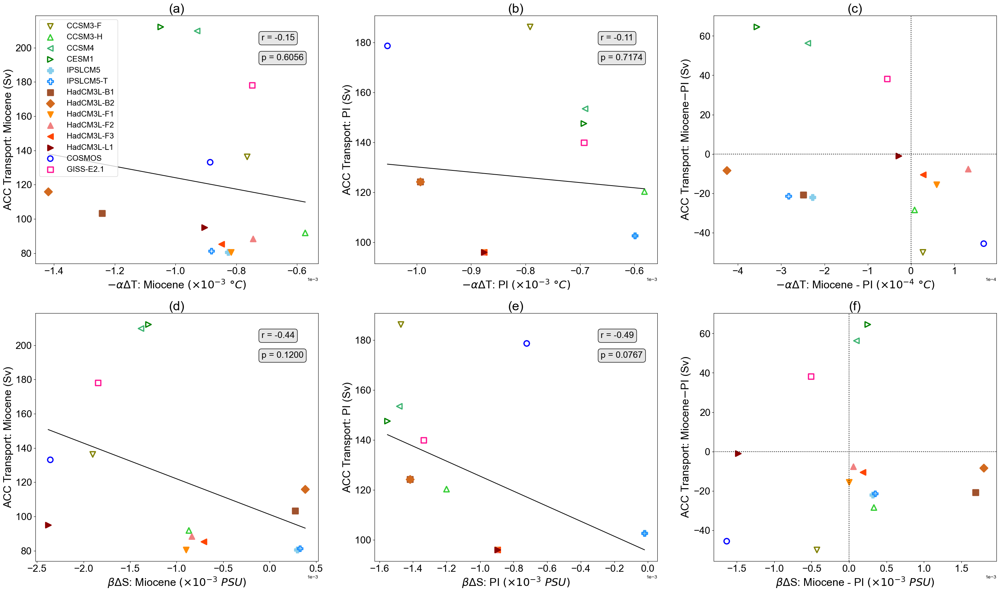

In [33]:
sh_wes_mio = meridional_gradients['Miocene_SH_westerlies'].to_numpy()
acc_drake_transp_mio = meridional_gradients['Miocene_ACC_transport'].to_numpy()
sh_wes_pi = meridional_gradients['PI_SH_westerlies'].to_numpy()
acc_drake_transp_pi = meridional_gradients['PI_ACC_transport'].to_numpy()
del_sigma2_mio = meridional_gradients['Miocene_meridional_density_difference'].to_numpy()
del_sigma2_pi = meridional_gradients['PI_meridional_density_difference'].to_numpy()
del_temp_mio = meridional_gradients['Miocene_meridional_temp_difference'].to_numpy()
del_temp_pi = meridional_gradients['PI_meridional_temp_difference'].to_numpy()
del_sal_mio = meridional_gradients['Miocene_meridional_salinity_difference'].to_numpy()
del_sal_pi = meridional_gradients['PI_meridional_salinity_difference'].to_numpy()


a0=1.67e-4  
b0=0.78e-3  # a0 = α0 and b0 = β0 are the constant coefficients of thermal expansion and haline contraction used in the simplified expression
#             of seawater EOS as per Vallis (2018) and Nycander et al. (2015). These produce realistic enough circulation as per Roquet et al. (2015)

# markers=['1','2','3','4','P','+','<','>','v','^','<','>','o','H']
# edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
# facecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','none','none','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
markers=['v','^','<','>','P','P','s','D','v','^','<','>','o','s']
edgecolors=['olive','limegreen','mediumseagreen','green','skyblue','dodgerblue','sienna','chocolate','darkorange','lightcoral','orangered','darkred','blue', 'deeppink']
facecolors=['none','none','none','none','skyblue','none','sienna','chocolate','darkorange','lightcoral','orangered','darkred','none', 'none']

labels=[' CCSM3-F (400 ppm)',' CCSM3-H (355 ppm)',' CCSM4 (400 ppm)',' CESM1 (400 ppm)',' IPSLCM5 (20Ma Tethys Closed 560 ppm)',
        ' IPSLCM5-T (20Ma Tethys Open 560 ppm)',' HadCM3L-B1 (No AIS 400 ppm)',' HadCM3L-B2 (AIS 55m SLE 400 ppm)',
        ' HadCM3L-F1 (Langhian Getech 400 ppm)',' HadCM3L-F2 (Langhian Getech 760 ppm)',' HadCM3L-F3 (Serravallian Getech 400 ppm)',
        ' HadCM3L-L1 (Langhian Scotese 494 ppm)',' COSMOS (450 ppm)',' GISS-E2.1 (456 ppm)']

labels1=[' CCSM3-F',' CCSM3-H',' CCSM4',' CESM1',' IPSLCM5',' IPSLCM5-T',' HadCM3L-B1',' HadCM3L-B2',' HadCM3L-F1',' HadCM3L-F2',
         ' HadCM3L-F3',' HadCM3L-L1',' COSMOS',' GISS-E2.1']
c='k'
mlw=2.5
f=22
f1=20
f2=26
tb_fs=18
s=120
bbox = dict(boxstyle="round", fc="0.9")


plt.figure(figsize=[35,20])


plt.subplot(231)

for i in range(14):
    plt.scatter(del_temp_mio[i]*a0*-1,acc_drake_transp_mio[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$ - \alpha \Delta$T: Miocene $( \times 10^{-3}\  °C)$', fontsize=f)
plt.ylabel('ACC Transport: Miocene (Sv)', fontsize=f)
plt.title('(a)', fontsize=f2)
plt.legend(loc=2, fontsize=16)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

m, b = np.polyfit(del_temp_mio*a0*-1, acc_drake_transp_mio, 1)
x_sorted = np.sort(del_temp_mio*a0*-1)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_temp_mio*a0*-1, acc_drake_transp_mio)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)


plt.subplot(232)

for i in range(14):
    plt.scatter(del_temp_pi[i]*a0*-1,acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$ - \alpha \Delta$T: PI $( \times 10^{-3} \ °C)$', fontsize=f)
plt.ylabel('ACC Transport: PI (Sv)', fontsize=f)
plt.title('(b)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

m, b = np.polyfit(del_temp_pi*a0*-1, acc_drake_transp_pi, 1)
x_sorted = np.sort(del_temp_pi*a0*-1)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_temp_pi*a0*-1, acc_drake_transp_pi)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

plt.subplot(233)

for i in range(14):
    plt.scatter((del_temp_mio[i]*a0*-1)-(del_temp_pi[i]*a0*-1),acc_drake_transp_mio[i]-acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)
plt.xlabel(r'$ - \alpha \Delta$T: Miocene - PI $( \times 10^{-4}\  °C)$', fontsize=f)
plt.ylabel('ACC Transport: Miocene$ - $PI (Sv)', fontsize=f)
plt.title('(c)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
plt.axhline(y=0,ls=':',c='k')
plt.axvline(x=0,ls=':',c='k')


plt.subplot(234)

for i in range(14):
    plt.scatter(del_sal_mio[i]*b0,acc_drake_transp_mio[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)

plt.xlabel(r'$\beta \Delta$S: Miocene $( \times 10^{-3}\  PSU)$', fontsize=f)
plt.ylabel('ACC Transport: Miocene (Sv)', fontsize=f)
plt.title('(d)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

m, b = np.polyfit(del_sal_mio*b0, acc_drake_transp_mio, 1)
x_sorted = np.sort(del_sal_mio*b0)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_sal_mio*b0, acc_drake_transp_mio)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

plt.subplot(235)

for i in range(14):
    plt.scatter(del_sal_pi[i]*b0,acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)
plt.xlabel(r'$\beta \Delta$S: PI $( \times 10^{-3} \ PSU)$', fontsize=f)
plt.ylabel('ACC Transport: PI (Sv)', fontsize=f)
plt.title('(e)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

m, b = np.polyfit(del_sal_pi*b0, acc_drake_transp_pi, 1)
x_sorted = np.sort(del_sal_pi*b0)
y_sorted = m * x_sorted + b

# Plot the regression line
plt.plot(x_sorted, y_sorted, c=c)

# Calculate Pearson correlation
r, p = stats.pearsonr(del_sal_pi*b0, acc_drake_transp_pi)

# Add the correlation annotation
plt.annotate('r = {:.2f}'.format(r), xy=(0.8, 0.9), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)
plt.annotate('p = {:.4f}'.format(p), xy=(0.8, 0.82), xycoords='axes fraction', fontsize=tb_fs, bbox=bbox)

plt.subplot(236)

for i in range(14):
    plt.scatter(del_sal_mio[i]*b0-del_sal_pi[i]*b0,acc_drake_transp_mio[i]-acc_drake_transp_pi[i],s=s,marker=markers[i],facecolors=facecolors[i],edgecolors=edgecolors[i], linewidths=mlw,label=labels1[i],zorder=1)
plt.xlabel(r'$\beta \Delta$S: Miocene - PI $( \times 10^{-3} \ PSU)$', fontsize=f)
plt.ylabel('ACC Transport: Miocene$ - $PI (Sv)', fontsize=f)
plt.title('(f)', fontsize=f2)
plt.yticks(fontsize=f1)
plt.xticks(fontsize=f1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
plt.axhline(y=0,ls=':',c='k')
plt.axvline(x=0,ls=':',c='k')

plt.savefig(f'{pathf}Miocene_PI_meridional_temp_sal_gradients.pdf', dpi=300, bbox_inches='tight')


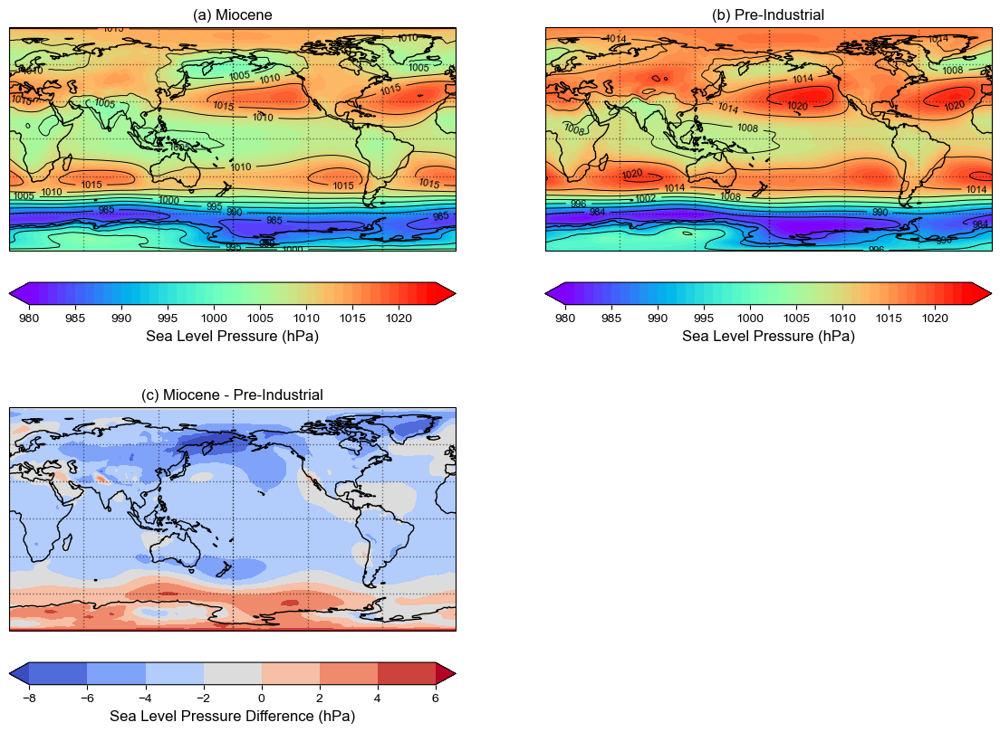

In [32]:
fig = plt.figure(figsize=(14, 10))
projection = ccrs.PlateCarree(180)
transform = ccrs.PlateCarree()
cmap='rainbow'
level=np.arange(980,1025,1)
f=12
# Panel 1
ax1 = plt.subplot(221, projection=projection)
cs1 = ax1.contourf(slp_mio.lon, slp_mio.lat, slp_mio.SLP_miocene.mean(dim='sim')/100, cmap=cmap, levels=level, transform=transform, extend='both')
ax1.coastlines()
ax1.set_title('(a) Miocene', fontsize=f)
gline(ax1, l=True, b=True, tick_size=10)
cbar1 = fig.colorbar(cs1, ax=ax1, orientation="horizontal", pad=0.1)
cbar1.set_label("Sea Level Pressure (hPa)", fontsize=f)
# contour lines
cl1 = ax1.contour(
    slp_mio.lon,
    slp_mio.lat,
    slp_mio.SLP_miocene.mean(dim='sim')/100,
    transform=transform,
    colors="k", linewidths=0.7
)
ax1.clabel(cl1, inline=True, fontsize=8, fmt="%.0f")

# Panel 2
ax2 = plt.subplot(222, projection=projection)
cs2 = ax2.contourf(slp_pi.lon, slp_pi.lat, slp_pi.SLP_PI.mean(dim='sim')/100, cmap=cmap, levels=level, transform=transform, extend='both' )
ax2.coastlines()
ax2.set_title('(b) Pre-Industrial', fontsize=f)
gline(ax2, l=True, tick_size=10, b=True )

cbar2 = fig.colorbar(cs2, ax=ax2, orientation="horizontal", pad=0.1)
cbar2.set_label("Sea Level Pressure (hPa)", fontsize=f)

cl2 = ax2.contour(
    slp_pi.lon,
    slp_pi.lat,
    slp_pi.SLP_PI.mean(dim='sim')/100,
    transform=transform,
    colors="k", linewidths=0.7
)
ax2.clabel(cl2, inline=True, fontsize=8, fmt="%.0f")



# Panel 3
ax3 = plt.subplot(223, projection=projection)
cs3 = ax3.contourf( slp_pi.lon, slp_pi.lat, slp_mio.SLP_miocene.mean(dim='sim')/100 - slp_pi.SLP_PI.mean(dim='sim')/100, cmap='coolwarm', transform=transform, extend='both' )
ax3.coastlines()
gline(ax3, l=True, tick_size=10, b=True)
ax3.set_title('(c) Miocene - Pre-Industrial', fontsize=f)
cbar3 = fig.colorbar(cs3, ax=ax3, orientation="horizontal", pad=0.1)
cbar3.set_label("Sea Level Pressure Difference (hPa)", fontsize=f)


# cl3 = ax3.contour(
#     slp_pi[0].lon,
#     slp_pi[0].lat,
#     slp_mio.mean(axis=0)/100 - slp_pi.mean(axis=0)/100,
#     transform=transform,
#     colors="k", linewidths=0.7
# )
# ax3.clabel(cl3, inline=True, fontsize=8, fmt="%.0f")
plt.savefig(f'{pathf}SLP_Mio_PI.pdf', dpi=300, bbox_inches='tight')
